# Forecasting Pickup Densities For Yellow Taxi Services In New York City:
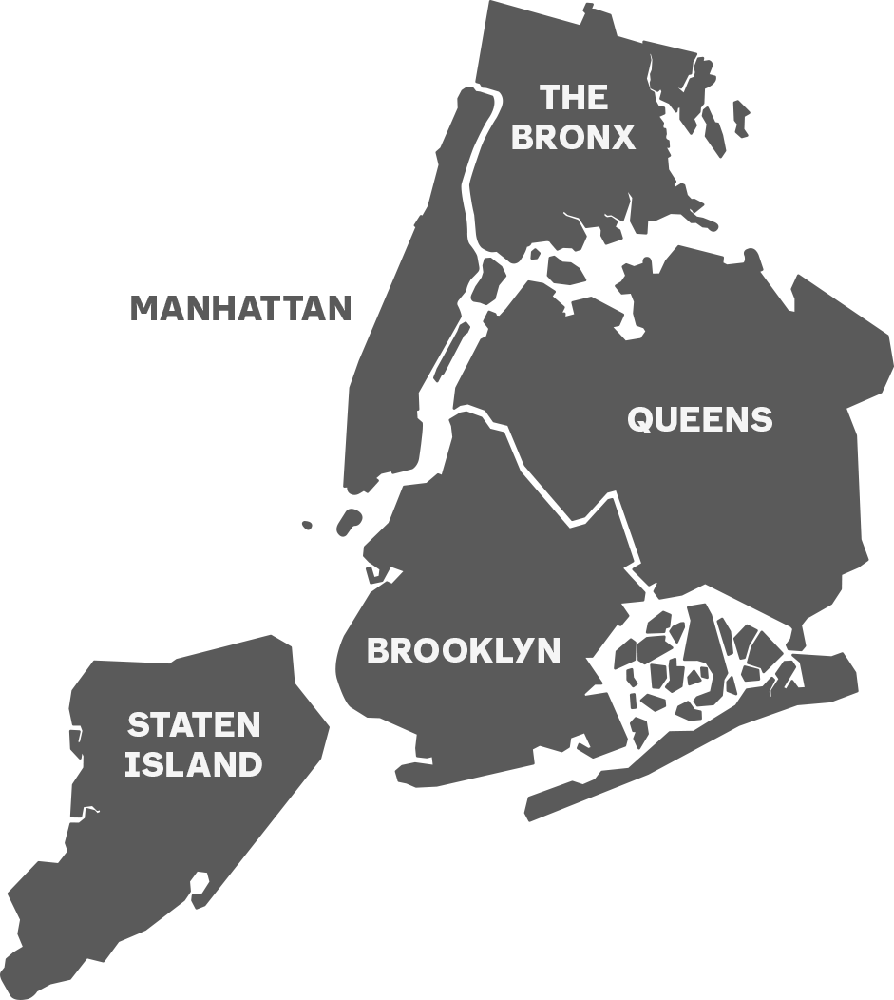

<img src='new_york.gif'>

In [1]:
#Use dask to read only necessary columns at a time. Speed up EDA
import dask.dataframe as dd#similar to pandas
import pandas as pd#pandas to create small dataframes 
import folium#open street map
import datetime#Convert to unix time
import time#Convert to unix time
import numpy as np#Do aritmetic operations on arrays
import seaborn as sns#Plots
import matplotlib.pylab as plt#Plots
import matplotlib  #Plots
from matplotlib import rcParams#Size of plots  
import gpxpy.geo#Get the haversine distance
from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering
import math
import pickle
import os
mingw_path = 'C:\\Program Files\\mingw-w64\\x86_64-5.3.0-posix-seh-rt_v4-rev0\\mingw64\\bin'
os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [2]:
#There are 19 columns
month = dd.read_csv('yellow_tripdata_2015-01.csv')
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


# Data Information

<ul>The yellow and green taxi trip records include fields capturing 
    <li>pick-up and drop-off dates/times, </li>
    <li>pick-up and drop-off locations, </li>
    <li>trip distances, </li>
    <li>itemized fares, </li>
    <li>rate types, </li>
    <li>payment types,</li>
    <li>driver-reported passenger counts. </li>
</ul>
<p>
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) 
</p>

## Information on taxis:

<h5> Yellow Taxi: Yellow Medallion Taxicabs</h5>
<p> These are the famous NYC yellow taxis that provide transportation exclusively through street-hails. The number of taxicabs is limited by a finite number of medallions issued by the TLC. You access this mode of transportation by standing in the street and hailing an available taxi with your hand. The pickups are not pre-arranged.</p>

<h5> For Hire Vehicles (FHVs) </h5>
<p> FHV transportation is accessed by a pre-arrangement with a dispatcher or limo company. These FHVs are not permitted to pick up passengers via street hails, as those rides are not considered pre-arranged. </p>

<h5> Green Taxi: Street Hail Livery (SHL) </h5>
<p>  The SHL program will allow livery vehicle owners to license and outfit their vehicles with green borough taxi branding, meters, credit card machines, and ultimately the right to accept street hails in addition to pre-arranged rides. </p>
<p> Credits: Quora</p>

<h5>Footnote:</h5>
In the given notebook we are considering only the yellow taxis for the year of 2015

# Data Collection
We Have collected all yellow taxi trips data from jan-2015 to dec-2016(Will be using only 2015 data)
<table>
<tr>
<th> file name </th>
<th> file name size</th>
<th> number of records </th>
<th> number of features </th>
</tr>
<tr>
<td> yellow_tripdata_2016-01 </td>
<td> 1. 59G </td>
<td> 10906858 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-02 </td>
<td> 1. 66G </td>
<td> 11382049 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-03 </td>
<td> 1. 78G </td>
<td> 12210952 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-04 </td>
<td> 1. 74G </td>
<td> 11934338 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-05 </td>
<td> 1. 73G </td>
<td> 11836853 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-06 </td>
<td> 1. 62G </td>
<td> 11135470 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-07 </td>
<td> 884Mb </td>
<td> 10294080 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-08 </td>
<td> 854Mb </td>
<td> 9942263 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-09 </td>
<td> 870Mb </td>
<td> 10116018 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-10 </td>
<td> 933Mb </td>
<td> 10854626 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-11 </td>
<td> 868Mb </td>
<td> 10102128 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-12 </td>
<td> 897Mb </td>
<td> 10449408 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-01 </td>
<td> 1.84Gb </td>
<td> 12748986 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-02 </td>
<td> 1.81Gb </td>
<td> 12450521 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-03 </td>
<td> 1.94Gb </td>
<td> 13351609 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-04 </td>
<td> 1.90Gb </td>
<td> 13071789 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-05 </td>
<td> 1.91Gb </td>
<td> 13158262 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-06 </td>
<td> 1.79Gb </td>
<td> 12324935 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-07 </td>
<td> 1.68Gb </td>
<td> 11562783 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-08 </td>
<td> 1.62Gb </td>
<td> 11130304 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-09 </td>
<td> 1.63Gb </td>
<td> 11225063 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-10 </td>
<td> 1.79Gb </td>
<td> 12315488 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-11 </td>
<td> 1.65Gb </td>
<td> 11312676 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-12 </td>
<td> 1.67Gb </td>
<td> 11460573 </td>
<td> 19 </td>
</tr>
</table>

## Features in the dataset:
<table border="1">
	<tr>
		<th>Field Name</th>
		<th>Description</th>
	</tr>
	<tr>
		<td>VendorID</td>
		<td>
		A code indicating the TPEP provider that provided the record.
		<ol>
			<li>Creative Mobile Technologies</li>
			<li>VeriFone Inc.</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>tpep_pickup_datetime</td>
		<td>The date and time when the meter was engaged.</td>
	</tr>
	<tr>
		<td>tpep_dropoff_datetime</td>
		<td>The date and time when the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Passenger_count</td>
		<td>The number of passengers in the vehicle. This is a driver-entered value.</td>
	</tr>
	<tr>
		<td>Trip_distance</td>
		<td>The elapsed trip distance in miles reported by the taximeter.</td>
	</tr>
	<tr>
		<td>Pickup_longitude</td>
		<td>Longitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>Pickup_latitude</td>
		<td>Latitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>RateCodeID</td>
		<td>The final rate code in effect at the end of the trip.
		<ol>
			<li> Standard rate </li>
			<li> JFK </li>
			<li> Newark </li>
			<li> Nassau or Westchester</li>
			<li> Negotiated fare </li>
			<li> Group ride</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Store_and_fwd_flag</td>
		<td>This flag indicates whether the trip record was held in vehicle memory before sending to the vendor,<br\> aka “store and forward,” because the vehicle did not have a connection to the server.
		<br\>Y= store and forward trip
		<br\>N= not a store and forward trip
		</td>
	</tr>

	<tr>
		<td>Dropoff_longitude</td>
		<td>Longitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Dropoff_ latitude</td>
		<td>Latitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Payment_type</td>
		<td>A numeric code signifying how the passenger paid for the trip.
		<ol>
			<li> Credit card </li>
			<li> Cash </li>
			<li> No charge </li>
			<li> Dispute</li>
			<li> Unknown </li>
			<li> Voided trip</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Fare_amount</td>
		<td>The time-and-distance fare calculated by the meter.</td>
	</tr>
	<tr>
		<td>Extra</td>
		<td>Miscellaneous extras and surcharges. Currently, this only includes. the $0.50 and $1 rush hour and overnight charges.</td>
	</tr>
	<tr>
		<td>MTA_tax</td>
		<td>0.50 MTA tax that is automatically triggered based on the metered rate in use.</td>
	</tr>
	<tr>
		<td>Improvement_surcharge</td>
		<td>0.30 improvement surcharge assessed trips at the flag drop. the improvement surcharge began being levied in 2015.</td>
	</tr>
	<tr>
		<td>Tip_amount</td>
		<td>Tip amount – This field is automatically populated for credit card tips.Cash tips are not included.</td>
	</tr>
	<tr>
		<td>Tolls_amount</td>
		<td>Total amount of all tolls paid in trip.</td>
	</tr>
	<tr>
		<td>Total_amount</td>
		<td>The total amount charged to passengers. Does not include cash tips.</td>
	</tr>
</table>

In [3]:
samples = 12748986+12450521+13351609+13071789+13158262+12324935+11562783+11130304+11225063+12315488+11312676+11460573
print(samples)

146112989


### Total number of samples for the year of 2015:
 - 146 million  

# Problem statement(Change)
<h3> Find out the pick up density give the time and a region.</h3>
<p> 
We will be taking the data of year 2015(12 months data) as train data, and test our model on year 2016 data.
</p>

## EDA for the months JAN - DEC
### Eventful days in january:
1. Thursday        :January 01	 New Years Day	
2. Monday	       :January 19	 Martin Luther King Jr. Day	Third Monday in January
3. Sunday-Tuesday  :January 25-27 Blizzard shuts down city
 
### Eventful days in february:
3. Thursday	:February 12	Lincoln's Birthday
4. Monday	:February 16	Presidents' Day	

### Eventful days in March

5. No repeating events

In [4]:
month.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


## Data Cleaning:


### 1. Removing the points outside of new york:
### New york bounding box:
1. min_lat <- 40.5774
2. max_lat <- 40.9176
3. min_long <- -74.15
4. max_long <- -73.7004

In [5]:
outlier_locations = month[(month.pickup_longitude != 0 and month.pickup_latitude != 0) & ((month.pickup_longitude <= -74.15) or (month.pickup_latitude <= 40.5774)or \
                   (month.pickup_longitude >= -73.7004) or (month.pickup_latitude >= 40.9176))]
#Optional
#Comment out if necessary
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')
sample_locations = outlier_locations.head(100)
for i,j in sample_locations.iterrows():
    folium.Marker(list((j['pickup_latitude'],j['pickup_longitude']))).add_to(map_osm)
map_osm

C:\Users\JackSparrow\AppData\Local\Continuum\Anaconda3\lib\site-packages\dask\dataframe\core.py:3804: UserWarning: Insufficient elements for `head`. 100 elements requested, only 69 elements available. Try passing larger `npartitions` to `head`.
  warnings.warn(msg.format(n, len(r)))


### As you can see above that there are some points just outside the boundary but many of them point to either South america, Mexico or Canada

## 2. Removing the outlier trips based on trip durations:

### TLC Regulations:
- According to TLC regulations the maximum allowed trip duration in a 24 hour interval is 12 hours.
- This means the maximum allowed work hours for a driver is 12 hours
- There are 24k trips which either violate this rule or have trip durations of 0 or less than zero(Wierd)

In [6]:
def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())

#return a dataframe with many parameters along with trip duration and trip pickup times(with outliers)
def return_with_trip_times():
    duration = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    #pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    #calculate duration of trips
    durations = (np.array(duration_drop) - np.array(duration_pickup))/float(60)

    #append durations of trips and pickup times in unix to a new dataframe
    new_frame = month[['VendorID','payment_type','passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','RateCodeID','store_and_fwd_flag']].compute()
    
    new_frame['trip_times'] = durations
    new_frame['pickup_times'] = duration_pickup
    new_frame['Speed'] = 60*(new_frame['trip_distance']/new_frame['trip_times'])
    
    return new_frame
#duration_dropoff

#outliers aren't still removed
#dataframe with durations and pickup unix time appended
frame_with_durations = return_with_trip_times()

Original: 12748986
Removing outliers from NY boundaries: 12455067 293919

trip times percentiles...
0.0th percentile -1211.017
10.0th percentile 3.867
20.0th percentile 5.4
30.0th percentile 6.833
40.0th percentile 8.317
50.0th percentile 9.95
60.0th percentile 11.867
70.0th percentile 14.267
80.0th percentile 17.583
90.0th percentile 23.333
100.0th percentile 23800.017
(12455067, 13) before frist
(12455067, 13) frist    VendorID  payment_type  passenger_count  trip_distance  pickup_longitude  \
0         2             1                1           1.59        -73.993896   
1         1             1                1           3.30        -74.001648   
2         1             2                1           1.80        -73.963341   
3         1             2                1           0.50        -74.009087   
4         1             2                1           3.00        -73.971176   

   pickup_latitude  dropoff_longitude  dropoff_latitude  RateCodeID  \
0        40.750111         -73.9

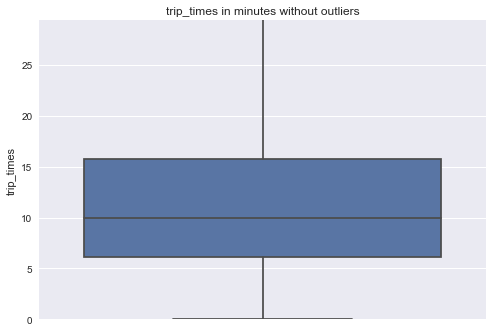

(12455067, 13) second

trip distance percentiles...
0.0th percentile 0.0
10.0th percentile 0.65
20.0th percentile 0.9
30.0th percentile 1.1
40.0th percentile 1.37
50.0th percentile 1.68
60.0th percentile 2.06
70.0th percentile 2.6
80.0th percentile 3.57
90.0th percentile 5.9
100.0th percentile 8000016.5
Removing outliers from trip distance: 12399797 55270


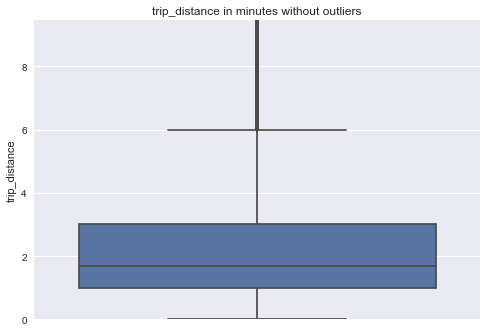


Speed percentiles...
0.0th percentile -0.228
10.0th percentile 6.413
20.0th percentile 7.811
30.0th percentile 8.929
40.0th percentile 9.98
50.0th percentile 11.066
60.0th percentile 12.281
70.0th percentile 13.785
80.0th percentile 15.939
90.0th percentile 20.104
100.0th percentile inf
Removing outliers from trip speed: 12391863 7934


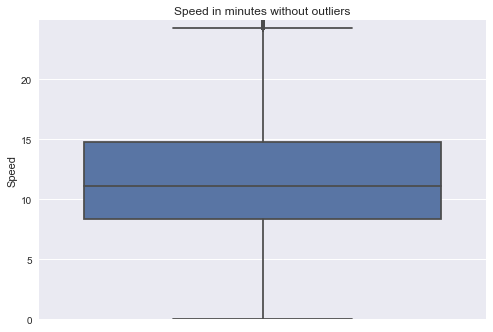

Total outliers removed 357123


In [7]:
def plot_boxplot(new_frame, string1, string2):
    var = new_frame[string1].values
#     print(string1,var, new_frame.shape)
    var = np.sort(var,axis = None)
#     print(string1, var.shape)
    if string2!="":
        plt.ylim(0, var[int(float(95)*len(var)/100)])
        sns.boxplot(y= string1, data = new_frame)
        sns.plt.title(string1+' in minutes without outliers')
        plt.show()
    return var
    
def remove_outliers(new_frame):
    print ("Original:",new_frame.shape[0])
    a = new_frame.shape[0]
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    print ("Removing outliers from NY boundaries:",new_frame.shape[0],(a - new_frame.shape[0]))
    b = new_frame.shape[0]

    print ("\ntrip times percentiles...")
    var = plot_boxplot(new_frame, "trip_times", "")
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))

    print(new_frame.shape, "before frist")
#     new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    print(new_frame.shape, "frist", new_frame.head())
    print ("Removing outliers from trip times:",new_frame.shape[0],(b - new_frame.shape[0]))
    var = plot_boxplot(new_frame, "trip_times", "out")
    print(new_frame.shape, "second")
#--------------------------------------------------------------
    print ("\ntrip distance percentiles...")
    var = plot_boxplot(new_frame, "trip_distance", "")
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))
                                   
    c = new_frame.shape[0]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    print ("Removing outliers from trip distance:",new_frame.shape[0],(c - new_frame.shape[0]))
    var = plot_boxplot(new_frame,"trip_distance", "out")
    
#--------------------------------------------------------------

    print ("\nSpeed percentiles...")
    var = plot_boxplot(new_frame, "Speed", "")  
    for i in range(0,len(var),int(float(10)*len(var)/100)):
        print ("{}th percentile {}".format(round(float(i)/len(var),3)*100,round(var[i],3)))
                                   
    d = new_frame.shape[0]
    new_frame = new_frame[(new_frame.Speed <= 65) & (new_frame.Speed >= 0)]
    print ("Removing outliers from trip speed:",new_frame.shape[0],(d - new_frame.shape[0]))
    var = plot_boxplot(new_frame, "Speed", "out")
    
#--------------------------------------------------------------   
    print( "Total outliers removed",a - new_frame.shape[0])
    return new_frame

frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)

In [8]:
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,trip_times,pickup_times,Speed
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,18.050000,1.421329e+09,5.285319
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,1,N,19.833333,1.420902e+09,9.983193
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,10.050000,1.420902e+09,10.746269
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,1.866667,1.420902e+09,16.071429
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,19.316667,1.420902e+09,9.318378


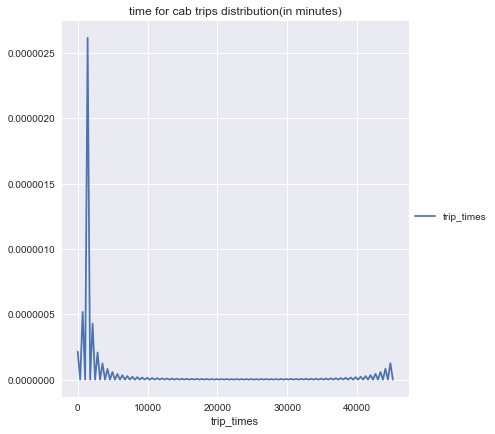

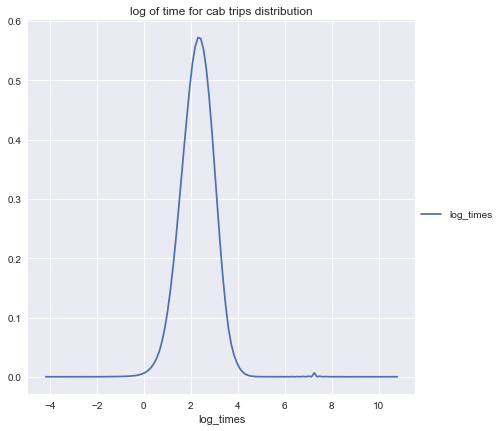

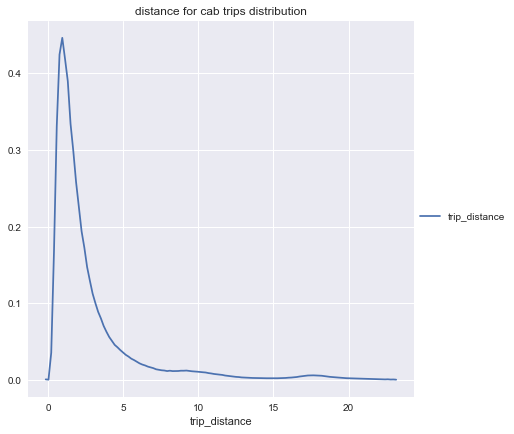

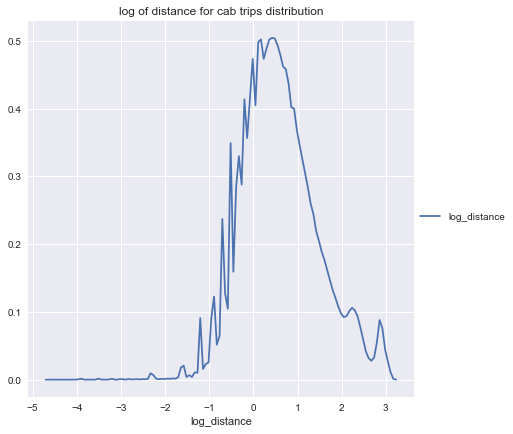

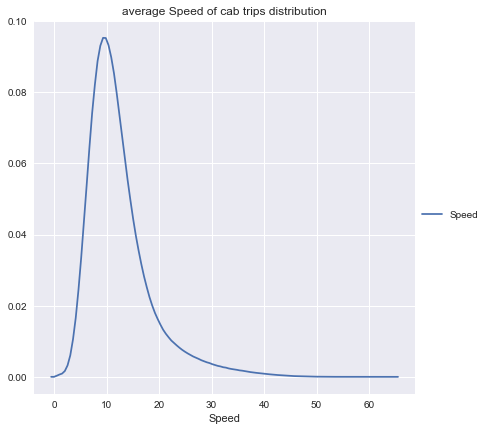

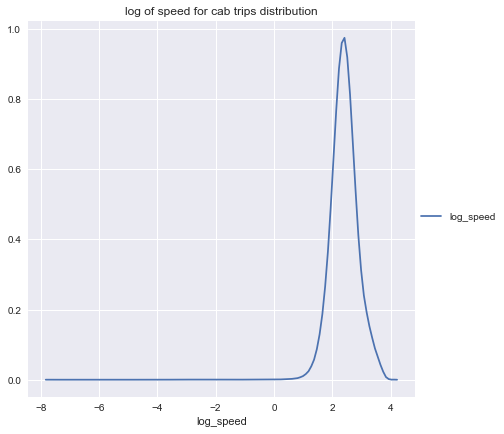

In [9]:
import seaborn as sns
#trip times
def dist_of_params(frame,variable,title):
    sns.FacetGrid(frame,size=6) \
      .map(sns.kdeplot, variable) \
      .add_legend();
    sns.plt.title(title)
    plt.show();

#trip times
dist_of_params(frame_with_durations_outliers_removed,'trip_times','time for cab trips distribution(in minutes)')

#log trip times
log_trip_times = frame_with_durations_outliers_removed.trip_times.values
frame_with_durations_outliers_removed['log_times'] = np.log(log_trip_times)
dist_of_params(frame_with_durations_outliers_removed,'log_times','log of time for cab trips distribution')

#trip distances
dist_of_params(frame_with_durations_outliers_removed,'trip_distance','distance for cab trips distribution')

#log trip distances
log_trip_distance = frame_with_durations_outliers_removed.trip_distance.values
frame_with_durations_outliers_removed['log_distance'] = np.log(log_trip_distance)
dist_of_params(frame_with_durations_outliers_removed,'log_distance','log of distance for cab trips distribution')

#trip speed
dist_of_params(frame_with_durations_outliers_removed,'Speed','average Speed of cab trips distribution')

#log speed
log_trip_speed = frame_with_durations_outliers_removed.Speed.values
frame_with_durations_outliers_removed['log_speed'] = np.log(log_trip_speed)
dist_of_params(frame_with_durations_outliers_removed,'log_speed','log of speed for cab trips distribution')


## Univariate Analysis of following features :
1. Vendor ID
2. Passenger counts
3. Rate Code ID
4. store and forward flags
5. Payment types


### Outlier Trip Distances:

## Outlier Dropoff and pickup points:
#### To simplify things new york has been divided into 37km x 37km box and any pickups or dropoffs outside this point is referred to as an outlier
1. There are 264.4k dropoffs happening outside of new york
2. There are 247.742 pickups happening outside of new york
3. How many travels have both drop off and pick ups outside of new york??
  - sdfsd

### Inspecting number of pickups shared among each of the vendors

In [10]:
#Get unique vendors
vendor_unique = frame_with_durations_outliers_removed.VendorID.unique()
Vendors = []
#Get the number of trips for each vendor
Vendors.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['VendorID'] == 1].shape[0])
Vendors.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['VendorID'] == 2].shape[0])
#Names of vendors
print("Unique vendors\n {}: Creative Mobile Technologies\n {}: VeriFone Inc\n".format(vendor_unique[1],vendor_unique[0]))
print ("Vendor 1 and Vendor 2 count:\n",Vendors)

Unique vendors
 1: Creative Mobile Technologies
 2: VeriFone Inc

Vendor 1 and Vendor 2 count:
 [5841962, 6549901]


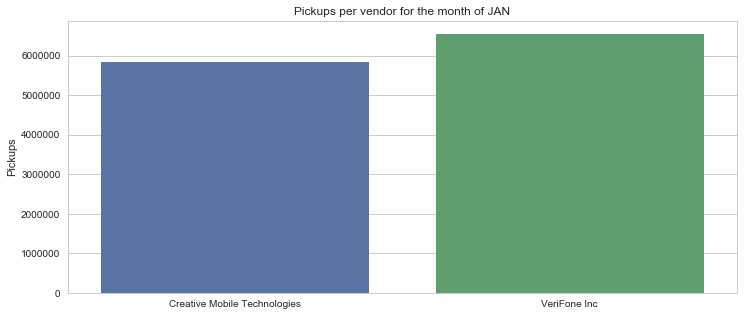

In [11]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = ['Creative Mobile Technologies', 'VeriFone Inc'] , y = np.array(Vendors))
ax.set(ylabel='Pickups')
sns.plt.title('Pickups per vendor for the month of JAN')
plt.show()

In [12]:
print ("Creative Mobile Technologies share :{} % VeriFone Inc share :{} % ".format(100*float(Vendors[1])/sum(Vendors),100*float(Vendors[0])/sum(Vendors)))

Creative Mobile Technologies share :52.85646718334443 % VeriFone Inc share :47.14353281665557 % 


### Both the vendors share almost same number of pickups in JAN month

In [13]:
#Get the number of pickups per each passenger count
passenger_count = []
passenger_uniq = set(frame_with_durations_outliers_removed['passenger_count'].values)
for i in passenger_uniq:
    passenger_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['passenger_count'] == i].shape[0])

#sort the passenger pickups based on the passenger count
pass_count_pickups = [x for _,x in sorted(zip(passenger_uniq,passenger_count))]
pass_count = [int(y) for y,_ in sorted(zip(passenger_uniq,passenger_count))]

print (pass_count)
print (pass_count_pickups)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[5841, 8717237, 1767371, 516166, 247081, 689157, 448998, 6, 2, 4]


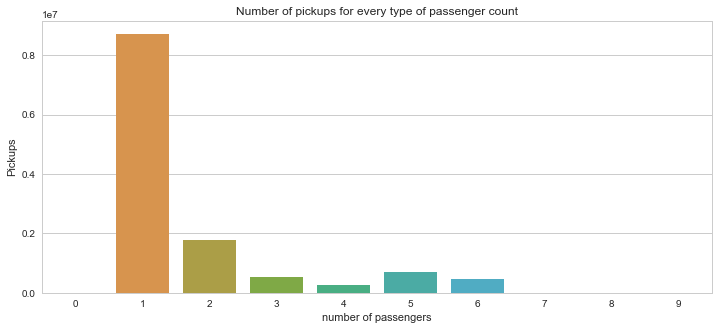

In [14]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(pass_count) , y = np.array(pass_count_pickups))
ax.set(ylabel='Pickups',xlabel = 'number of passengers')
sns.plt.title('Number of pickups for every type of passenger count')
plt.show()

In [15]:
for a,b in zip(pass_count,pass_count_pickups):
    print ("Pickups for passenger count {} : {}% of total pickups".format(int(a),round(float(b)*100/sum(pass_count_pickups),4)))

Pickups for passenger count 0 : 0.0471% of total pickups
Pickups for passenger count 1 : 70.3465% of total pickups
Pickups for passenger count 2 : 14.2624% of total pickups
Pickups for passenger count 3 : 4.1654% of total pickups
Pickups for passenger count 4 : 1.9939% of total pickups
Pickups for passenger count 5 : 5.5614% of total pickups
Pickups for passenger count 6 : 3.6233% of total pickups
Pickups for passenger count 7 : 0.0% of total pickups
Pickups for passenger count 8 : 0.0% of total pickups
Pickups for passenger count 9 : 0.0% of total pickups


## Inference from the passenger count:
1. Majority of the trips seem to have 1 as the ideal number of passengers with 2 as the close second
2. What do the passenger count with 0 say?
  - Human error? - 
  - Maybe some form of goods delivery?
3. According to the TLC regulations 5 is the maximum number of passengers allowed in a yellow taxi
  - Good amount of trips have more than 5 passengers - almost 45k of them
  - Toddlers and children below age 7 are allowed to sit on laps
  - Maybe the drivers take into account the toddlers too(But still 7 ,8 and 9 are ridiculous numbers for passenger counts)

## Rate Code:
1. Standard rate
2. JFK
3. Newark
4. Nassau or Westchester
5. Negotiated fare
6. Group ride

In [16]:
#Unique rate codes
rate_codes_uniq = set(frame_with_durations_outliers_removed['RateCodeID'].values)
rate_count = []
for i in rate_codes_uniq:
    rate_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['RateCodeID'] == i].shape[0])
#sort the pickups based on the rate codes
rate_code_pickups = [x for _,x in sorted(zip(rate_codes_uniq,rate_count))]
rate_code = [int(y) for y,_ in sorted(zip(rate_codes_uniq,rate_count))]
Trips = ['Standard rates','JFK trips','Newark trips','Nassau/Westchester trips','Negotiated fare','Group rides','unknownrate code']


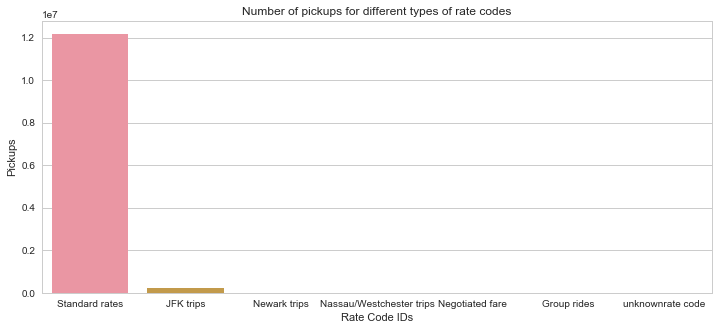

In [17]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(Trips) , y = np.array(rate_code_pickups))
ax.set(ylabel='Pickups',xlabel = 'Rate Code IDs')
sns.plt.title('Number of pickups for different types of rate codes')
plt.show()

In [18]:
for a,b in zip(Trips,rate_code_pickups):
    print ("Pickups for/with {} accounts {}% of total pickups".format(a,round(float(b)*100/sum(rate_code_pickups),4)))

Pickups for/with Standard rates accounts 98.2089% of total pickups
Pickups for/with JFK trips accounts 1.6787% of total pickups
Pickups for/with Newark trips accounts 0.0072% of total pickups
Pickups for/with Nassau/Westchester trips accounts 0.0133% of total pickups
Pickups for/with Negotiated fare accounts 0.0894% of total pickups
Pickups for/with Group rides accounts 0.0003% of total pickups
Pickups for/with unknownrate code accounts 0.0023% of total pickups


## Rate Codes(Findings from the data):

1. Standard rate - 12.4 Million trips
2. JFK - 224.2k trips
3. Newark - 17.7k trips
4. Nassau or Westchester - 4.1k trips
5. Negotiated fare - 36.8k trips
6. Group ride - 134 trips
7. rate code 99(mistake??) - 507 trips

### Store and forward flags

In [19]:
SWflag_uniq = set(frame_with_durations_outliers_removed['store_and_fwd_flag'].values)
SWflag_count = []
for i in SWflag_uniq :
    SWflag_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['store_and_fwd_flag'] == i].shape[0])
print (SWflag_count)
SWflag_uniq = list(SWflag_uniq)
print (SWflag_uniq)

[12286027, 105836]
['N', 'Y']


In [20]:
for a,b in zip(SWflag_uniq,SWflag_count):
    print ("Pickups for/with store and forward = {} accounts {}% of total pickups".format(a,round(float(b)*100/sum(SWflag_count),4)))

Pickups for/with store and forward = N accounts 99.1459% of total pickups
Pickups for/with store and forward = Y accounts 0.8541% of total pickups


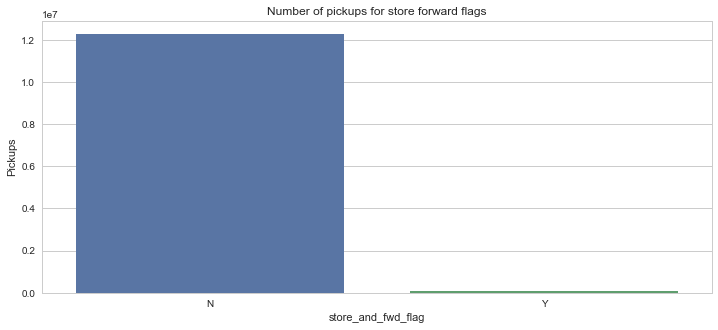

In [21]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(SWflag_uniq) , y = np.array(SWflag_count))
ax.set(ylabel='Pickups',xlabel = 'store_and_fwd_flag')
sns.plt.title('Number of pickups for store forward flags')
plt.show()

## Payment types:
1. Credit card
2. Cash
3. No charge
4. Dispute
5. Unknown
6. Voided trip

In [22]:
payment_uniq = set(frame_with_durations_outliers_removed['payment_type'].values)
payment_count = []
for i in payment_uniq :
    payment_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['payment_type'] == i].shape[0])
print (payment_count)
payment_uniq = list(payment_uniq)
print (payment_uniq)

[7685155, 4670834, 26634, 9238, 2]
[1, 2, 3, 4, 5]


In [23]:
pay_pickups = [x for _,x in sorted(zip(payment_uniq,payment_count))]
pay = [int(y) for y,_ in sorted(zip(payment_uniq,payment_count))]
pay_type = ['Credit card','Cash','No charge','Dispute','Unknow']

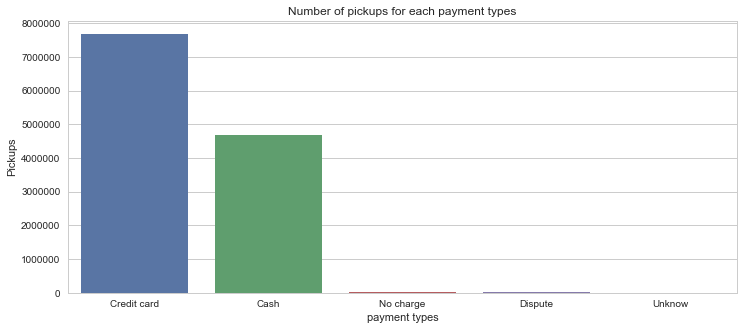

In [24]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(pay_type) , y = np.array(pay_pickups))
ax.set(ylabel='Pickups',xlabel = 'payment types')
sns.plt.title('Number of pickups for each payment types')
plt.show()

In [25]:
for a,b in zip(pay_type,pay_pickups):
    print ("Pickups with payment types {} accounts to :{}% of total pickups".format(a,round(float(b)*100/sum(pay_pickups),4)))

Pickups with payment types Credit card accounts to :62.0178% of total pickups
Pickups with payment types Cash accounts to :37.6928% of total pickups
Pickups with payment types No charge accounts to :0.2149% of total pickups
Pickups with payment types Dispute accounts to :0.0745% of total pickups
Pickups with payment types Unknow accounts to :0.0% of total pickups


## Pickup and dropoff locations on maps:

In [26]:
frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)

coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values

#Getting 40 clusters using the kmeans 
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
frame_with_durations_outliers_removed['dropoff_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['dropoff_latitude', 'dropoff_longitude']])

In [27]:
#Get regions
def Convert_Clusters(frame,cluster):
    region=[]
    colors = []
    Queens=[4,16,22,23,26,35,36]
    Brooklyn=[11,19,29,37]
    for i in frame[cluster].values:
        if i==2:
            region.append("JFK")
            #Green - JFK
            colors.append('#7CFC00')
        elif i==13:
            region.append("Bronx")
            #Red - Bronx
            colors.append('#DC143C')
        elif i in Queens:
            region.append("Queens")
            #Blue - Queens
            colors.append('#00FFFF')
        elif i in Brooklyn:
            region.append("Brooklyn")
            #Brooklyn - yellow orange
            colors.append('#FFD700')
        else:
            region.append("Manhattan")
            #White - manhattan
            colors.append('#FFFFFF')
    frame['Regions '+cluster]=region
    return frame,colors

frame_with_durations_outliers_removed,colors_pickup=Convert_Clusters(frame_with_durations_outliers_removed,'pickup_cluster')
frame_with_durations_outliers_removed,colors_dropoff=Convert_Clusters(frame_with_durations_outliers_removed,'dropoff_cluster')
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,...,Speed,log_times,log_distance,log_speed,lat_bin,lon_bin,pickup_cluster,dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,...,5.285319,2.893146,0.463734,1.664933,40.7501,-73.9939,32,27,Manhattan,Manhattan
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,1,N,...,9.983193,2.987364,1.193922,2.300903,40.7242,-74.0016,6,8,Manhattan,Manhattan
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,...,10.746269,2.307573,0.587787,2.374559,40.8028,-73.9633,28,12,Manhattan,Manhattan
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,...,16.071429,0.624154,-0.693147,2.777043,40.7138,-74.0091,9,6,Manhattan,Manhattan
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,...,9.318378,2.960968,1.098612,2.231989,40.7624,-73.9712,15,21,Manhattan,Manhattan


C:\Users\JackSparrow\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: FutureWarning: 
mpl_style had been deprecated and will be removed in a future version.
Use `matplotlib.pyplot.style.use` instead.

C:\Users\JackSparrow\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  


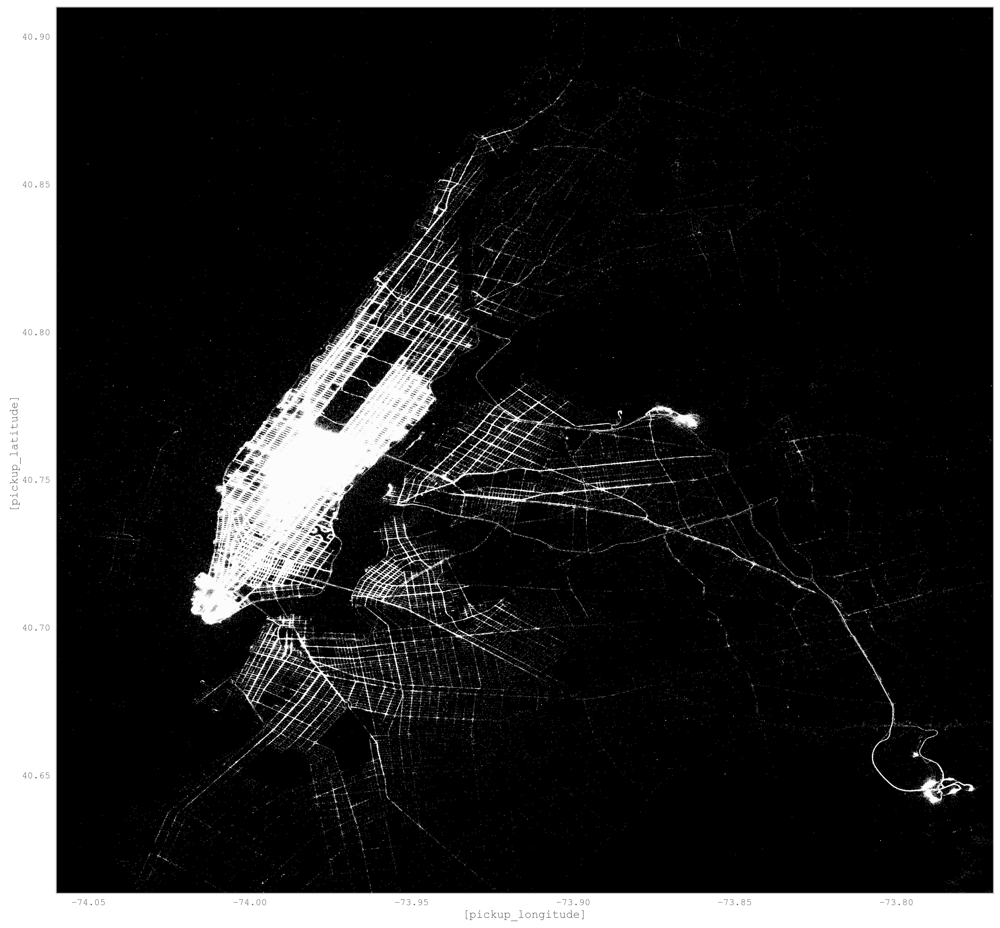

C:\Users\JackSparrow\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: FutureWarning: 
mpl_style had been deprecated and will be removed in a future version.
Use `matplotlib.pyplot.style.use` instead.



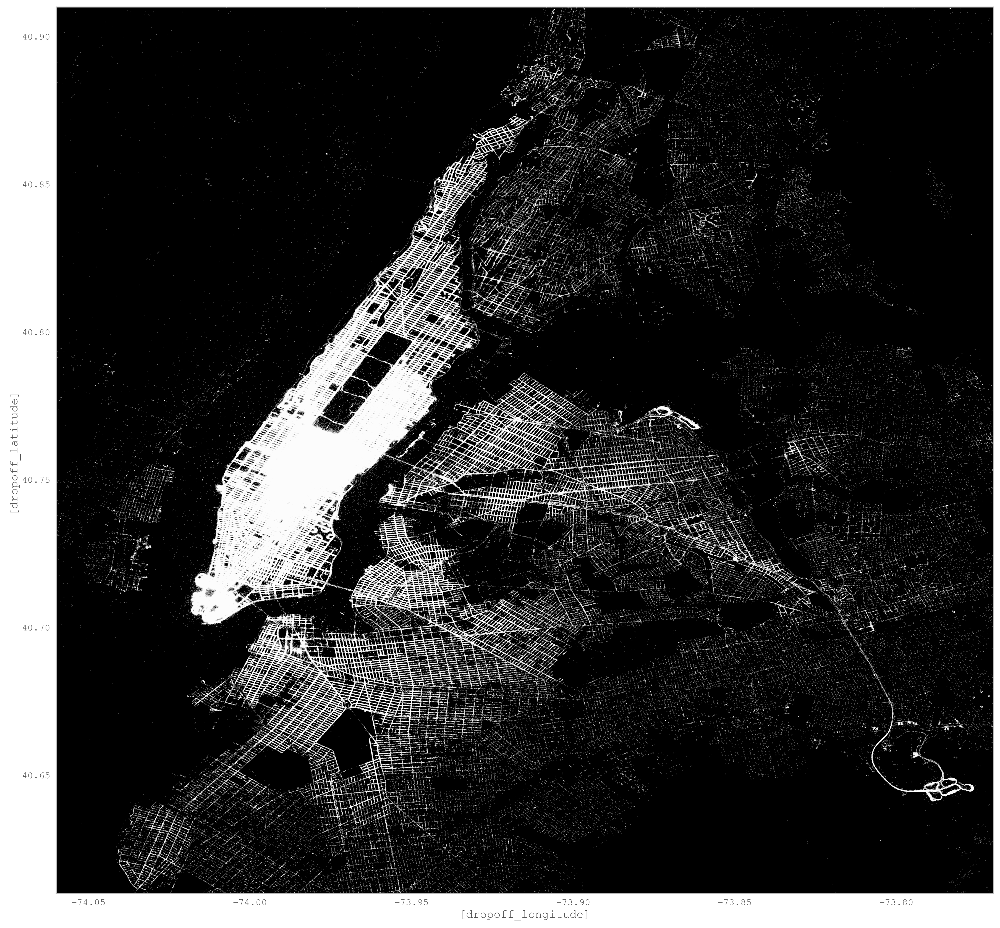

In [28]:
def plot_scatter_locations(frame,colors,choose):
    %matplotlib inline 

    pd.options.display.mpl_style = 'default' #Better Styling  
    new_style = {'grid': False} #Remove grid  
    matplotlib.rc('axes', **new_style)  
    rcParams['figure.figsize'] = (17.5, 17) #Size of figure  
    rcParams['figure.dpi'] = 250
    
    var1 = choose+'_longitude'
    var2 = choose+'_latitude'

    P=frame.plot(kind='scatter', x=[var1], y=[var2],color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
    P.set_axis_bgcolor('black') #Background Color
    plt.savefig('plot_'+choose+'.png')
    plt.show()
    

plot_scatter_locations(frame_with_durations_outliers_removed,colors_pickup,'pickup')
plot_scatter_locations(frame_with_durations_outliers_removed,colors_dropoff,'dropoff')

<b>INFERENCE</b>:
1. The pickup locations seem to be concentrated in the manhattan area
2. The dropoff locations seem to be spread over the brooklyn and queens as will along with the manhattan area

In [29]:
def compute_pickups_per_day():
    time = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'])
    time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
    time["pickup_hour"] = time['tpep_pickup_datetime'].dt.strftime('%H').astype(int)
    set(time['pickup_day'].values)
    day_pickups = []
    night_pickups = []
    mid_night_pickups = []
    afternoon_pickups = []
    for i in range(1,8):
        day_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 6) & (time.pickup_hour < 12)].shape[0])
        night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 18) & (time.pickup_hour <= 23)].shape[0])
        mid_night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 0) & (time.pickup_hour < 6)].shape[0])
        afternoon_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 12) & (time.pickup_hour < 18)].shape[0])
    
    days =pd.DataFrame({'morning':day_pickups, 'afternoon':afternoon_pickups, 'night':night_pickups, 'midnight':mid_night_pickups})
    days.plot(kind='bar', stacked=True,figsize=(4.5, 4.5))
    plt.xlabel('Days of the week')
    plt.ylabel('Number of pickups')
    plt.tick_params(axis='both', which='minor')
    plt.plot()
    #plt.xticks(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    for i in range(0,len(days)):
        print ("{} -  morning:{} , day:{} , mid-day:{} night:{}".format(days[i],mid_night_pickups[i],day_pickups[i],afternoon_pickups[i],night_pickups[i]))
    
    return time

Monday -  morning:108576 , day:408179 , mid-day:434850 night:381266
Tuesday -  morning:76339 , day:372232 , mid-day:415968 night:509383
Wednesday -  morning:104280 , day:481818 , mid-day:488264 night:609625
Thursday -  morning:260968 , day:545611 , mid-day:606775 night:754859
Friday -  morning:200685 , day:547113 , mid-day:629661 night:849728
Saturday -  morning:433710 , day:399576 , mid-day:724563 night:821859
Sunday -  morning:377923 , day:276211 , mid-day:525948 night:403016


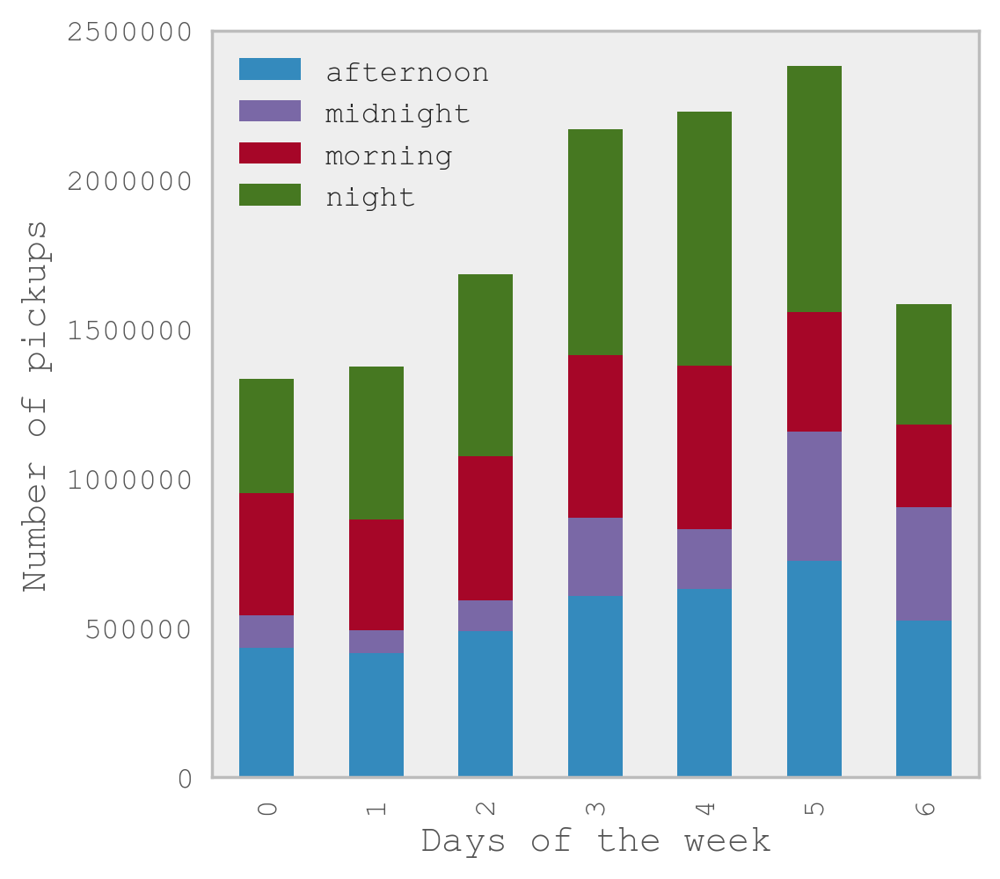

In [30]:
times_of_day_dframe = compute_pickups_per_day()

## Inference:
1. More commute happens during the day[6:00 to 18:59 hrs] time compared to the night[19:00 to 23:59 hrs] or morning[00:00 to 5:59 hrs]
2. Saturday seems to be the busiest days for the taxi drivers overall
3. Most midnight commutes happen on saturdays 
4. Interestingly more commute happens during the midnight compared to on sunday than on saturday
5. Midnight commute during on saturdays are the highest and consecutively friday night commutes seem to be the highest(Friday night parties)

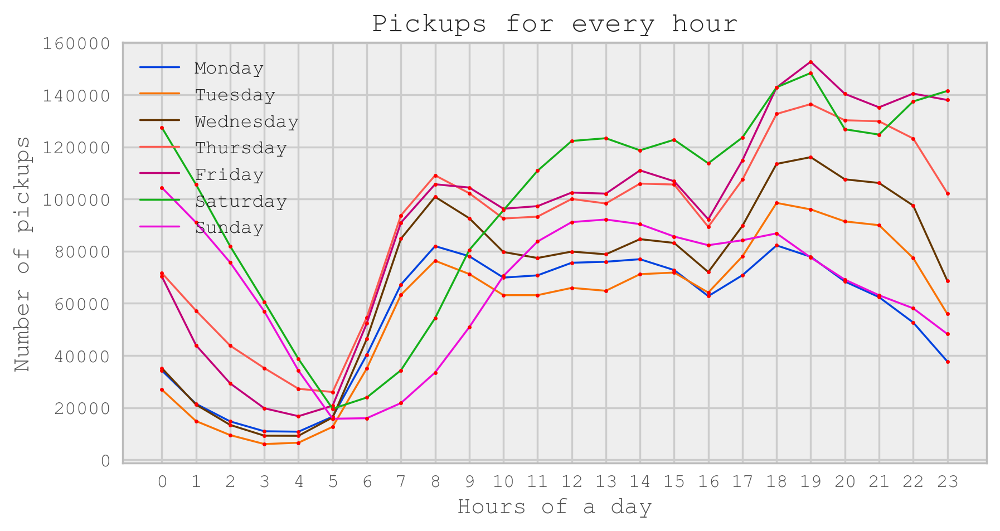

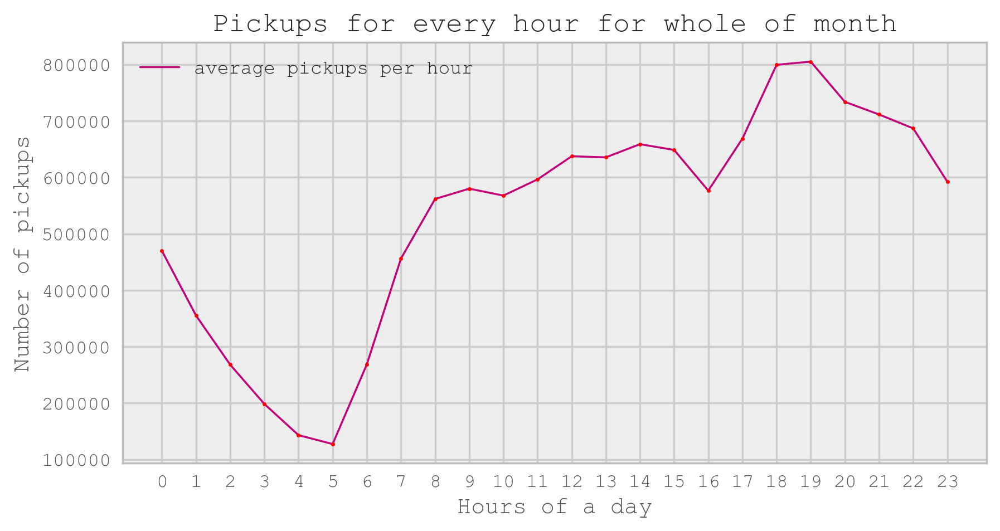

In [31]:
#pickups and distances travelled at what time of the day??
def pickup_in_day(frame):
    hour_pickups = []
    temp = []
    for i in range(1,8):
        for j in range(0,24):
            temp.append(frame[(frame.pickup_day == i) & (frame.pickup_hour == j)].shape[0])
        hour_pickups.append(temp)
        temp = []
    colors = ['xkcd:blue','xkcd:orange','xkcd:brown','xkcd:coral','xkcd:magenta','xkcd:green','xkcd:fuchsia']
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    for k in range(0,7):
        plt.plot(hours_lis,hour_pickups[k],colors[k],label = days[k])
        plt.plot(hours_lis,hour_pickups[k], 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    hour_pickup_month = []
    for j in range(0,24):
        hour_pickup_month.append(frame[frame.pickup_hour == j].shape[0])

    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    plt.plot(hours_lis,hour_pickup_month,'xkcd:magenta',label = 'average pickups per hour')
    plt.plot(hours_lis,hour_pickup_month, 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour for whole of month')
    plt.legend()
    plt.grid(True)
    plt.show()

pickup_in_day(times_of_day_dframe)

### Clustering of regions:

In [32]:
frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)

In [33]:
#Find the best cluster where least number of clusters have a min. radius of atleast 1km or more
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values

def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    for i in range(0, cluster_len-1):
        min_value = 1000000
        for j in range(i+1, cluster_len):
            min_value = min(min_value, gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],cluster_centers[j][0], cluster_centers[j][1]))
        if min_value!=1000000 and (min_value/1000) >= 1:
            nice_points +=1
        else:
            wrong_points += 1
    print (cluster_len, "Cents with min distance < 1:", wrong_points, "Cents with min distance > 1:", nice_points)

    if nice_points == cluster_len-1:
        return 1
    else:
        return 0

def find_clusters(increment):
    kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000).fit(coords)
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    cluster_centers = kmeans.cluster_centers_
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len

for increment in range(10, 100, 10):
    cluster_centers, cluster_len = find_clusters(increment)
    more_than_5km = find_min_distance(cluster_centers, cluster_len)            

10 Cents with min distance < 1: 0 Cents with min distance > 1: 9
20 Cents with min distance < 1: 1 Cents with min distance > 1: 18
30 Cents with min distance < 1: 6 Cents with min distance > 1: 23
40 Cents with min distance < 1: 11 Cents with min distance > 1: 28
50 Cents with min distance < 1: 21 Cents with min distance > 1: 28
60 Cents with min distance < 1: 29 Cents with min distance > 1: 30
70 Cents with min distance < 1: 37 Cents with min distance > 1: 32
80 Cents with min distance < 1: 45 Cents with min distance > 1: 34
90 Cents with min distance < 1: 53 Cents with min distance > 1: 36


### Inference:
- The main objective was to find a optimal min. distance(Which roughly estimates to the radius of a cluster) between the clusters which we got was 40

In [34]:
#Getting 40 clusters using the kmeans 
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

In [35]:
#Adding a new column describing what cluster the pickup point belongs to
frame_with_durations_outliers_removed.head(5)

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,...,Speed,log_times,log_distance,log_speed,lat_bin,lon_bin,pickup_cluster,dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,...,5.285319,2.893146,0.463734,1.664933,40.7501,-73.9939,31,27,Manhattan,Manhattan
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,1,N,...,9.983193,2.987364,1.193922,2.300903,40.7242,-74.0016,2,8,Manhattan,Manhattan
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,...,10.746269,2.307573,0.587787,2.374559,40.8028,-73.9633,5,12,Manhattan,Manhattan
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,...,16.071429,0.624154,-0.693147,2.777043,40.7138,-74.0091,12,6,Manhattan,Manhattan
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,...,9.318378,2.960968,1.098612,2.231989,40.7624,-73.9712,28,21,Manhattan,Manhattan


In [36]:
#Plotting the cluster centers on OSM
cluster_centers = kmeans.cluster_centers_
cluster_len = len(cluster_centers)
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')
for i in range(cluster_len):
    folium.Marker(list((cluster_centers[i][0],cluster_centers[i][1])), popup=(str(cluster_centers[i][0])+str(cluster_centers[i][1]))).add_to(map_osm)
map_osm

### Plotting the clusters:

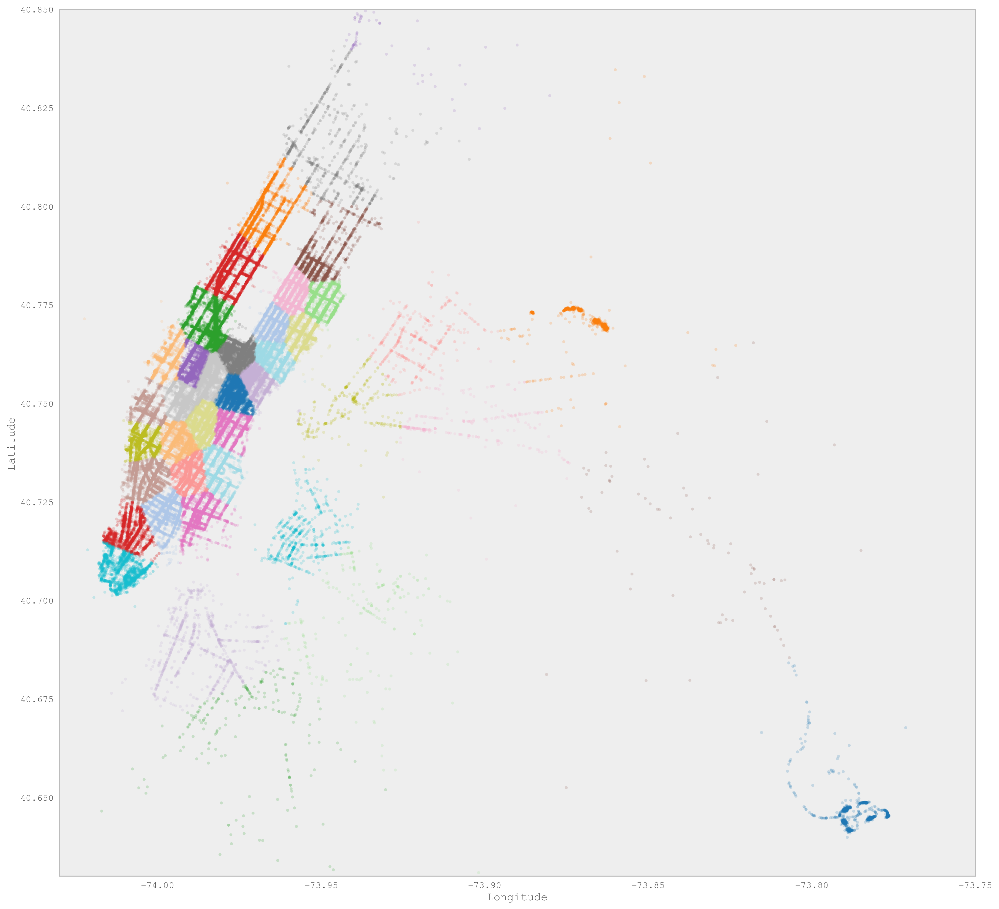

In [37]:
def plot_clusters(frame):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)
    fig, ax = plt.subplots(ncols=1, nrows=1)
    ax.scatter(frame.pickup_longitude.values[:100000], frame.pickup_latitude.values[:100000], s=10, lw=0,
               c=frame.pickup_cluster.values[:100000], cmap='tab20', alpha=0.2)
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()

plot_clusters(frame_with_durations_outliers_removed)

In [38]:
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,...,Speed,log_times,log_distance,log_speed,lat_bin,lon_bin,pickup_cluster,dropoff_cluster,Regions pickup_cluster,Regions dropoff_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,...,5.285319,2.893146,0.463734,1.664933,40.7501,-73.9939,31,27,Manhattan,Manhattan
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,1,N,...,9.983193,2.987364,1.193922,2.300903,40.7242,-74.0016,2,8,Manhattan,Manhattan
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,...,10.746269,2.307573,0.587787,2.374559,40.8028,-73.9633,5,12,Manhattan,Manhattan
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,...,16.071429,0.624154,-0.693147,2.777043,40.7138,-74.0091,12,6,Manhattan,Manhattan
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,...,9.318378,2.960968,1.098612,2.231989,40.7624,-73.9712,28,21,Manhattan,Manhattan


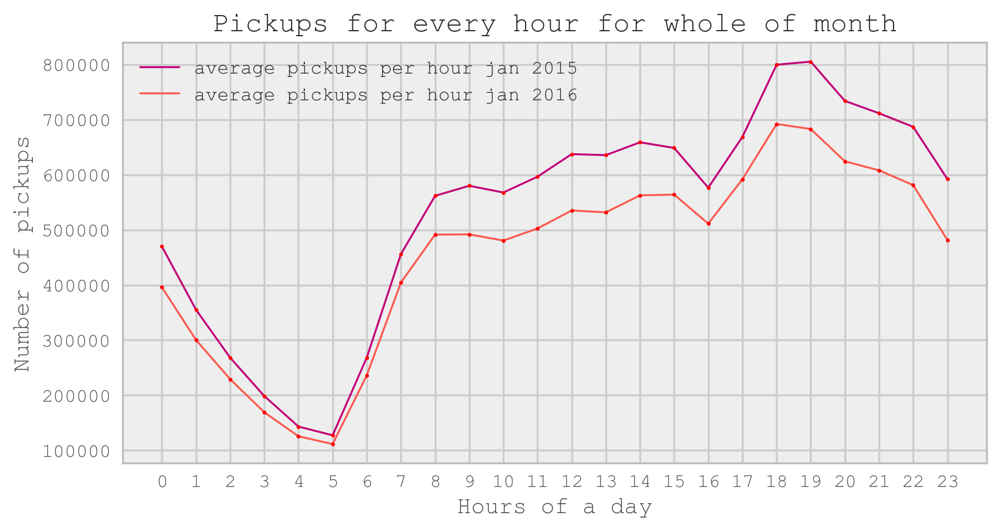

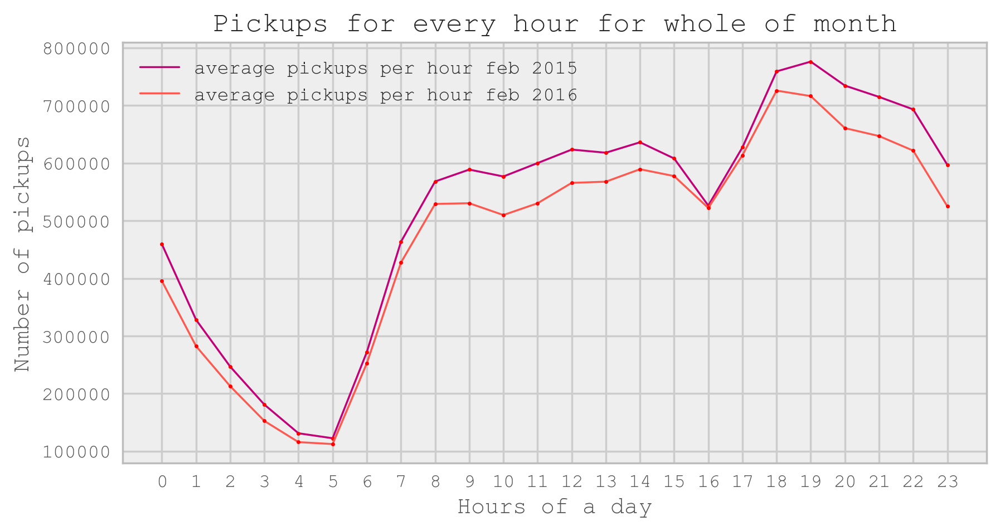

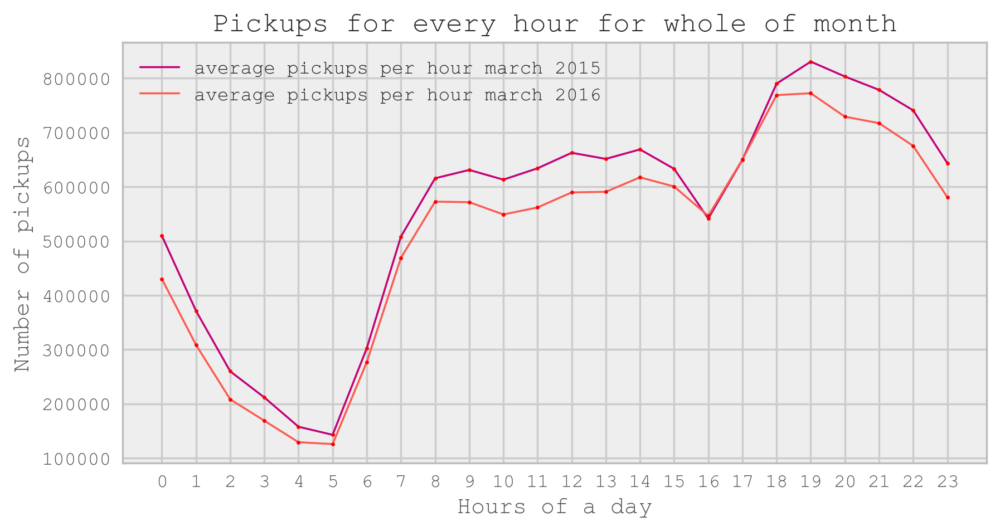

In [39]:
def plot_2015_v_2016(hour_pickup_month_2015,hour_pickup_month_2016,month):
    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    plt.plot(hours_lis,hour_pickup_month_2015,'xkcd:magenta',label = 'average pickups per hour '+month+' 2015')
    plt.plot(hours_lis,hour_pickup_month_2015, 'ro',  markersize=2)

    plt.plot(hours_lis,hour_pickup_month_2016,'xkcd:coral',label = 'average pickups per hour '+month+' 2016')
    plt.plot(hours_lis,hour_pickup_month_2016, 'ro',  markersize=2)


    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour for whole of month')
    plt.legend()
    plt.grid(True)
    plt.show()
    
#pickups and distances travelled at what time of the day??
def compute_pickups_per_day(month):
    
    time = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'])
    time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
    time["pickup_hour"] = time['tpep_pickup_datetime'].dt.strftime('%H').astype(int)
    return time


def pickup_in_day(frame):
    hour_pickups = []
    temp = []
    for i in range(1,8):
        for j in range(0,24):
            temp.append(frame[(frame.pickup_day == i) & (frame.pickup_hour == j)].shape[0])
        hour_pickups.append(temp)
        temp = []
        
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

    hour_pickup_month = []
    for j in range(0,24):
        hour_pickup_month.append(frame[frame.pickup_hour == j].shape[0])

    return hour_pickup_month

# jan month

month_jan_2015 = dd.read_csv('yellow_tripdata_2015-01.csv')
month_jan_2016 = dd.read_csv('yellow_tripdata_2016-01.csv')
times_of_day_dframe_jan_2015 = compute_pickups_per_day(month_jan_2015)
times_of_day_dframe_jan_2016 = compute_pickups_per_day(month_jan_2016)

hour_pickup_month_jan_2015 = pickup_in_day(times_of_day_dframe_jan_2015)
hour_pickup_month_jan_2016 = pickup_in_day(times_of_day_dframe_jan_2016)

plot_2015_v_2016(hour_pickup_month_jan_2015, hour_pickup_month_jan_2016, 'jan')

# feb month

month_feb_2015 = dd.read_csv('yellow_tripdata_2015-02.csv')
month_feb_2016 = dd.read_csv('yellow_tripdata_2016-02.csv')
times_of_day_dframe_feb_2015 = compute_pickups_per_day(month_feb_2015)
times_of_day_dframe_feb_2016 = compute_pickups_per_day(month_feb_2016)

hour_pickup_month_feb_2015 = pickup_in_day(times_of_day_dframe_feb_2015)
hour_pickup_month_feb_2016 = pickup_in_day(times_of_day_dframe_feb_2016)

plot_2015_v_2016(hour_pickup_month_feb_2015, hour_pickup_month_feb_2016, 'feb')

# march month

month_march_2015 = dd.read_csv('yellow_tripdata_2015-03.csv')
month_march_2016 = dd.read_csv('yellow_tripdata_2016-03.csv')
times_of_day_dframe_march_2015 = compute_pickups_per_day(month_march_2015)
times_of_day_dframe_march_2016 = compute_pickups_per_day(month_march_2016)

hour_pickup_month_march_2015 = pickup_in_day(times_of_day_dframe_march_2015)
hour_pickup_month_march_2016 = pickup_in_day(times_of_day_dframe_march_2016)

plot_2015_v_2016(hour_pickup_month_march_2015, hour_pickup_month_march_2016, 'march')

## End of EDA

## Removing Outliers

In [2]:
def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())

#return a dataframe with many parameters along with trip duration and trip pickup times(with outliers)
def return_with_trip_times(month):
    duration = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    #pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    #calculate duration of trips
#     print "calculating trip durations..."
    duration_pickup = np.array(duration_pickup)
    duration_drop = np.array(duration_drop)
    durations = duration_drop - duration_pickup
    durations = durations/float(60)
    #create a pandas dataframeof durations and pickups
#     print "appending trip durations..."
    
    duration_dataframe = pd.DataFrame({'trip_times': durations})
    pickup_dataframe = pd.DataFrame({'pickup_times' : duration_pickup})
    #append durations of trips and pickup times in unix to a new dataframe
    new_frame = month[['trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']].compute()
    new_frame.reset_index(drop=True, inplace=True)
    duration_dataframe.reset_index(drop=True, inplace=True)
    pickup_dataframe.reset_index(drop = True, inplace = True)
    new_frame = pd.concat([new_frame,duration_dataframe,pickup_dataframe],axis = 1)
    new_frame['Speed'] = 60*(new_frame['trip_distance']/new_frame['trip_times'])
    
    return new_frame

def remove_outliers(new_frame):
#     print "Original:",new_frame.shape[0]
    a = new_frame.shape[0]
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
#     print "Removing outliers from NY boundaries:",new_frame.shape[0],(a - new_frame.shape[0])
    b = new_frame.shape[0]
    
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
#     print "Removing outliers from trip times:",new_frame.shape[0],(b - new_frame.shape[0])
    
    c = new_frame.shape[0]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
#     print "Removing outliers from trip distance:",new_frame.shape[0],(c - new_frame.shape[0])
    
    d = new_frame.shape[0]
    new_frame = new_frame[(new_frame.Speed <= 65) & (new_frame.Speed >= 0)]
#     print "Removing outliers from trip speed:",new_frame.shape[0],(d - new_frame.shape[0])
    
#     print "Total outliers removed",a - new_frame.shape[0]
    return new_frame

def add_pickup_bins(frame,month,year):
    unix_pickup_times=[i for i in frame['pickup_times'].values]
    #jan 2015,feb 2015, mar 2015, jan 2016,feb 2016 ,mar 2016
    unix_times = [[1420070400,1422748800,1425168000,1427846400,1430438400,1433116800],\
                    [1451606400,1454284800,1456790400,1459468800,1462060800,1464739200]]
    
    start_pickup_unix=unix_times[year-2015][month-1]
    tenminutewise_binned_unix_pickup_times=[(int((i-start_pickup_unix)/600)+33) for i in unix_pickup_times]
    frame['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
    return frame

In [3]:
def jan_2015():
    print ("Reading 2015..")
    month_1 = dd.read_csv('yellow_tripdata_2015-01.csv')
    print ("Return with trip times..")

    frame_with_durations_2015 = return_with_trip_times(month_1)
    
    print ("Remove outliers..")
    frame_with_durations_outliers_removed_2015 = remove_outliers(frame_with_durations_2015)
    
    #Add two new columns
    print ("Adding Lat and lon bin..")
    frame_with_durations_outliers_removed_2015['lat_bin'] = np.round(frame_with_durations_outliers_removed_2015['pickup_latitude'],4)
    frame_with_durations_outliers_removed_2015['lon_bin'] = np.round(frame_with_durations_outliers_removed_2015['pickup_longitude'],4)

    #vertically append
    print ("vstacking coordinates..")
    coords_2015 = np.vstack((frame_with_durations_outliers_removed_2015[['pickup_latitude', 'pickup_longitude']].values,
                        frame_with_durations_outliers_removed_2015[['pickup_latitude', 'pickup_longitude']].values))

    #Getting 40 clusters using the kmeans and for each point find the clusters
    print ("Estimating clusters..")
    kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000).fit(coords_2015)
    frame_with_durations_outliers_removed_2015['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed_2015[['pickup_latitude', 'pickup_longitude']])
    
    print ("Final groupbying..")
    final_updated_frame_2015 = add_pickup_bins(frame_with_durations_outliers_removed_2015,1,2015)
    final_groupby_frame_2015 = final_updated_frame_2015[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()

    return kmeans,final_updated_frame_2015,final_groupby_frame_2015

kmeans,jan_2015_frame,jan_2015_groupby = jan_2015()

Reading 2015..
Return with trip times..
Remove outliers..
Adding Lat and lon bin..
vstacking coordinates..
Estimating clusters..
Final groupbying..


In [5]:
def grouby_months(month,kmeans,month_no,year_no):
    
    print ("Return with trip times..")

    frame_with_durations = return_with_trip_times(month)
    
    print ("Remove outliers..")
    frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
    
    #Add two new columns
    print ("Adding Lat and lon bin..")
    frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
    frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)

    print ("Estimating clusters..")
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    #frame_with_durations_outliers_removed_2016['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed_2016[['pickup_latitude', 'pickup_longitude']])

    print ("Final groupbying..")
    final_updated_frame = add_pickup_bins(frame_with_durations_outliers_removed,month_no,year_no)
    final_groupby_frame = final_updated_frame[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()
    
    return final_updated_frame,final_groupby_frame
    
month_jan_2016 = dd.read_csv('yellow_tripdata_2016-01.csv')
#month_feb_2015 = dd.read_csv('yellow_tripdata_2015-02.csv')
month_feb_2016 = dd.read_csv('yellow_tripdata_2016-02.csv')
#month_mar_2015 = dd.read_csv('yellow_tripdata_2015-03.csv')
month_mar_2016 = dd.read_csv('yellow_tripdata_2016-03.csv')

jan_2016_frame,jan_2016_groupby = grouby_months(month_jan_2016,kmeans,1,2016)
#feb_2015_frame,feb_2015_groupby = grouby_months(month_feb_2015,kmeans,2,2015)
feb_2016_frame,feb_2016_groupby = grouby_months(month_feb_2016,kmeans,2,2016)
#mar_2015_frame,mar_2015_groupby = grouby_months(month_mar_2015,kmeans,3,2015)
mar_2016_frame,mar_2016_groupby = grouby_months(month_mar_2016,kmeans,3,2016)

Return with trip times..
Remove outliers..
Adding Lat and lon bin..
Estimating clusters..
Final groupbying..
Return with trip times..
Remove outliers..
Adding Lat and lon bin..
Estimating clusters..
Final groupbying..
Return with trip times..
Remove outliers..
Adding Lat and lon bin..
Estimating clusters..
Final groupbying..


## Smoothing

In [6]:
def return_unq_pickup_bins(frame):
    values = []
    for i in range(0,40):
        new = frame[frame['pickup_cluster'] == i]
        list_unq = list(set(new['pickup_bins']))
        list_unq.sort()
        values.append(list_unq)
    return values

In [7]:
#Gets unique pickup bins for each bins
#jan
jan_2015_unique = return_unq_pickup_bins(jan_2015_frame)
jan_2016_unique = return_unq_pickup_bins(jan_2016_frame)

#feb
feb_2016_unique = return_unq_pickup_bins(feb_2016_frame)

#march
mar_2016_unique = return_unq_pickup_bins(mar_2016_frame)

In [8]:
def smoothing(count_values,values):
    smoothed_regions=[]
    ind=0
    repeat=0
    smoothed_value=0
    for r in range(0,40):
        smoothed_bins=[]
        repeat=0
        for i in range(4464):
            if repeat!=0:
                repeat-=1
                continue
            if i in values[r]:
                smoothed_bins.append(count_values[ind])
            else:
                if i!=0:
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]:
                            continue
                        else:
                            right_hand_limit=j
                            break
                            
                    if right_hand_limit==0:
                        smoothed_value=count_values[ind-1]*1.0/((4463-i)+2)*1.0                               
                        for j in range(i,4464):                              
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(4463-i)
                        ind-=1
                    else:
                        smoothed_value=(count_values[ind-1]+count_values[ind])*1.0/((right_hand_limit-i)+2)*1.0             
                        for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(right_hand_limit-i)
                else:
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]:
                            continue
                        else:
                            right_hand_limit=j
                            break
                    smoothed_value=count_values[ind]*1.0/((right_hand_limit-i)+1)*1.0
                    for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                    repeat=(right_hand_limit-i)
            ind+=1
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions


In [9]:
jan_2015_smooth = smoothing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)
jan_2016_smooth = smoothing(jan_2016_groupby['trip_distance'].values,jan_2016_unique)
feb_2016_smooth = smoothing(feb_2016_groupby['trip_distance'].values,feb_2016_unique)
mar_2016_smooth = smoothing(mar_2016_groupby['trip_distance'].values,mar_2016_unique)

regions_cum = []
for i in range(0,40):
    regions_cum.append(jan_2016_smooth[4464*i:4464*(i+1)]+feb_2016_smooth[4032*i:4032*(i+1)]+mar_2016_smooth[4464*i:4464*(i+1)])


In [141]:
#jan
ratios_jan = pd.DataFrame()
ratios_jan['Given']=jan_2015_smooth
ratios_jan['Prediction']=jan_2016_smooth
ratios_jan['Ratios']=ratios_jan['Prediction']*1.0/ratios_jan['Given']*1.0

## Modelling:

Now we get into modelling in order to forecast the pickup densities for the months of Jan, Feb and March of 2016 for which we are using multiple models with two variations 
1. Using Ratios of the 2016 data to the 2015 data i.e $\begin{align} R_{t} = Value^{2016}_{t} / Value^{2015}_{t} \end{align}$
2. Using Previous known values of the 2016 data itself to predict the future values

### Moving Averages
The First Model used is the Moving Averages Model which uses the previous n values in order to predict the next value <br> 

Using Ratio Values - $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3} .... R_{t-n} )/n \end{align}$

In [176]:
def MA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    error=[]
    predicted_values=[]
    window_size=3
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            predicted_ratio=sum((ratios['Ratios'].values)[(i+1)-window_size:(i+1)])/window_size
        else:
            predicted_ratio=sum((ratios['Ratios'].values)[0:(i+1)])/(i+1)
            
    
    ratios['MA_R_Predicted'] = predicted_values
    ratios['MA_R_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 3 is optimal for getting the best results using Moving Averages using previous Ratio values therefore we get $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3})/3 \end{align}$

Next we use the Movuing averages of the 2016  values itself to predict the future value using $\begin{align}P_{t} = ( P_{t-1} + P_{t-2} + P_{t-3} .... P_{t-n} )/n \end{align}$

In [177]:
def MA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=1
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            predicted_value=int(sum((ratios['Prediction'].values)[(i+1)-window_size:(i+1)])/window_size)
        else:
            predicted_value=int(sum((ratios['Prediction'].values)[0:(i+1)])/(i+1))
            
    ratios['MA_P_Predicted'] = predicted_values
    ratios['MA_P_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 1 is optimal for getting the best results using Moving Averages using previous 2016 values therefore we get $\begin{align}P_{t} = P_{t-1} \end{align}$

### Weighted Moving Averages
The Moving Avergaes Model used gave equal importance to all the values in the window used, but we know intuitively that the future is more likely to be similar to the latest values and less similar to the older values. Weighted Averages converts this analogy into a mathematical relationship giving the highest weight while computing the averages to the latest previous value and decreasing weights to the subsequent older ones<br>

Weighted Moving Averages using Ratio Values - $\begin{align}R_{t} = ( N*R_{t-1} + (N-1)*R_{t-2} + (N-2)*R_{t-3} .... 1*R_{t-n} )/(N*(N+1)/2) \end{align}$

In [178]:
def WA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.5
    error=[]
    predicted_values=[]
    window_size=5
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Ratios'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
        else:
            sum_values=0
            sum_of_coeff=0
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Ratios'].values)[j-1]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
            
    ratios['WA_R_Predicted'] = predicted_values
    ratios['WA_R_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 5 is optimal for getting the best results using Weighted Moving Averages using previous Ratio values therefore we get $\begin{align} R_{t} = ( 5*R_{t-1} + 4*R_{t-2} + 3*R_{t-3} + 2*R_{t-4} + R_{t-5} )/15 \end{align}$

Weighted Moving Averages using Previous 2016 Values - $\begin{align}P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2) \end{align}$

In [179]:
def WA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=2
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Prediction'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)

        else:
            sum_values=0
            sum_of_coeff=0
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Prediction'].values)[j-1]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)
    
    ratios['WA_P_Predicted'] = predicted_values
    ratios['WA_P_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 5 is optimal for getting the best results using Weighted Moving Averages using previous 2016 values therefore we get $\begin{align} P_{t} = ( 2*R_{t-1} + R_{t-2} )/3 \end{align}$

### Exponential Moving Averages
Through weighted averaged we have satisfied the analogy of giving higher weights to the latest value and decreasing weights to the subsequent ones but we still do not know which is the correct weighting scheme as there are infinetly many possibilities in which we can assign weights in a non-increasing order and tune the the hyperparameter window-size. To simplify this process we use Exponential Moving Averages which is a more logical way towards assigning weights and at the same time also using an optimal window-size.

In exponential moving averages we use a single hyperparameter alpha $\begin{align}(\alpha)\end{align}$ which is a value between 0 & 1 and based on the value of the hyperparameter alpha the weights and the window sizes are configured.<br>
For eg. If $\begin{align}\alpha=0.9\end{align}$ then the number of days on which the value of the current iteration is based is~$\begin{align}1/(1-\alpha)=10\end{align}$ i.e. we consider values 10 days prior before we predict the value for the current iteration. Also the weights are assigned using $\begin{align}2/(N+1)=0.18\end{align}$ ,where N = number of prior values being considered, hence from this it is implied that the first or latest value is assigned a weight of 0.18 which keeps exponentially decreasing for the subsequent values.

$\begin{align}R_{t} = \alpha*R_{t-1} + (1-\alpha)*R^{'}_{t-1}  \end{align}$

In [180]:
def EA_R1_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.6
    error=[]
    predicted_values=[]
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        predicted_ratio = (alpha*predicted_ratio) + (1-alpha)*((ratios['Ratios'].values)[i])
    
    ratios['EA_R1_Predicted'] = predicted_values
    ratios['EA_R1_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$

In [181]:
def EA_P1_Predictions(ratios,month):
    predicted_value= (ratios['Prediction'].values)[0]
    alpha=0.3
    error=[]
    predicted_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        predicted_value =int((alpha*predicted_value) + (1-alpha)*((ratios['Prediction'].values)[i]))
    
    ratios['EA_P1_Predicted'] = predicted_values
    ratios['EA_P1_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

$\begin{align}R_{t} = R^{'}_{t-1} + \alpha*(R_{t-1} - R^{'}_{t-1})  \end{align}$

In [182]:
def EA_R2_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.5
    error=[]
    predicted_values=[]
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        predicted_ratio = predicted_ratio + alpha*(((ratios['Ratios'].values)[i])-predicted_ratio)
    
    
    ratios['EA_R2_Predicted'] = predicted_values
    ratios['EA_R2_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

$\begin{align}P_{t} = P^{'}_{t-1} + \alpha*(P_{t-1} - P^{'}_{t-1})  \end{align}$

In [183]:
def EA_P2_Predictions(ratios,month):
    predicted_ratio=0
    check_ratio=(ratios['Ratios'].values)[0]
    alpha=0.5
    alpha_const=0.5
    error=[]
    error_ratio=0.0
    predicted_values=[]
    predicted_value=(ratios['Prediction'].values)[0]
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs(math.pow(int((abs(predicted_value-(ratios['Prediction'].values)[i]))),1)))
        predicted_value =int( (predicted_value) + (alpha)*((ratios['Prediction'].values)[i]-predicted_value))
    
    ratios['EA_P2_Predicted'] = predicted_values
    ratios['EA_P2_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

In [184]:
mean_err=[0]*10
median_err=[0]*10
ratios_jan,mean_err[0],median_err[0]=MA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[1],median_err[1]=MA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[2],median_err[2]=WA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[3],median_err[3]=WA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[4],median_err[4]=EA_R1_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[5],median_err[5]=EA_P1_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[6],median_err[6]=EA_R2_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[7],median_err[7]=EA_P2_Predictions(ratios_jan,'jan')

In [185]:
def EA_R2_Corrected_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.5
    error=[]
    predicted_values=[]
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_value= int(((ratios['Given'].values)[i])*predicted_ratio)
        previous_actual_value = (ratios['Prediction'].values)[i-1]
        if abs(predicted_value - previous_actual_value)>120:
            predicted_value = (ratios['Given'].values)[i] - (ratios['Given'].values)[i-1]
            if abs(predicted_value - previous_actual_value)>50:
                predicted_value = previous_actual_value
        predicted_values.append(predicted_value)
        error.append(abs(math.pow(predicted_value-(ratios['Prediction'].values)[i],1)))
        predicted_ratio = predicted_ratio + alpha*(((ratios['Ratios'].values)[i])-predicted_ratio)
    ratios['EA_R2_Corrected_Predicted'] = predicted_values
    ratios['EA_R2_Corrected_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

In [186]:
ratios_jan,mean_err[8],median_err[8]=EA_R2_Corrected_Predictions(ratios_jan,'jan')

## Comparison between forecasting models
We have chosen our error metric for comparison between models as <b>MAPE (Mean Absolute Percentage Error)</b> so that we can know that on an average how good is our model with predictions and <b>MSE (Mean Squared Error)</b> is also used so that we have a clearer understanding as to how well our forecasting model performs with outliers so that we make sure that there is not much of a error margin between our prediction and the actual value

In [192]:
print "Error Metric Matrix (Forecasting Methods) - MAPE & MSE"
print "--------------------------------------------------------------------------------------------------------"
print "Moving Averages (Ratios) -                             MAPE: ",mean_err[0],"      MSE: ",median_err[0]
print "Moving Averages (2016 Values) -                        MAPE: ",mean_err[1],"       MSE: ",median_err[1]
print "--------------------------------------------------------------------------------------------------------"
print "Weighted Moving Averages (Ratios) -                    MAPE: ",mean_err[2],"      MSE: ",median_err[2]
print "Weighted Moving Averages (2016 Values) -               MAPE: ",mean_err[3],"      MSE: ",median_err[3]
print "--------------------------------------------------------------------------------------------------------"
print "Exponential Moving Averages -1 (Ratios) -              MAPE: ",mean_err[4],"      MSE: ",median_err[4]
print "Exponential Moving Averages -1 (2016 Values) -         MAPE: ",mean_err[5],"      MSE: ",median_err[5]
print "--------------------------------------------------------------------------------------------------------"
print "Exponential Moving Averages -2 (Ratios) -              MAPE: ",mean_err[6],"      MSE: ",median_err[6]
print "Exponential Moving Averages -2 (2016 Values) -         MAPE: ",mean_err[7],"      MSE: ",median_err[7]
print "--------------------------------------------------------------------------------------------------------"
print "Exponential Moving Averages -2 (Ratios) -              MAPE: ",mean_err[6],"      MSE: ",median_err[6]
print "Exponential Moving Averages -2 (Ratios) Corrected -    MAPE: ",mean_err[8],"       MSE: ",median_err[8]
print "--------------------------------------------------------------------------------------------------------"

Error Metric Matrix (Forecasting Methods) - MAPE & MSE
--------------------------------------------------------------------------------------------------------
Moving Averages (Ratios) -                             MAPE:  0.184092244858       MSE:  634.59516129
Moving Averages (2016 Values) -                        MAPE:  0.14154328979        MSE:  174.251232079
--------------------------------------------------------------------------------------------------------
Weighted Moving Averages (Ratios) -                    MAPE:  0.180392020697       MSE:  530.21484655
Weighted Moving Averages (2016 Values) -               MAPE:  0.134361808018       MSE:  161.808742159
--------------------------------------------------------------------------------------------------------
Exponential Moving Averages -1 (Ratios) -              MAPE:  0.179088007615       MSE:  372.346029346
Exponential Moving Averages -1 (2016 Values) -         MAPE:  0.134210968577       MSE:  160.008501344
--------------

<b>Plese Note:-</b> The above comparisons are made using Jan 2015 and Jan 2016 only

From the above matrix it is inferred that the best forecasting model for our prediction would be:-
$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$ i.e Exponential Moving Averages using 2016 Values

## Using Tree Based Regression Models

### Train-Test Split
Before we start predictions using the tree based regression models we take 3 months of 2016 pickup data and split it such that for every region we have 70% data in train and 30% in test, ordered date-wise for every region

In [30]:
number_of_time_stamps = 5
output = []
tsne_lat = []
tsne_lon = []
tsne_weekday = []
tsne_feature = []
tsne_feature = [0]*number_of_time_stamps
for i in range(0,40):
    tsne_lat.append([kmeans.cluster_centers_[i][0]]*12955)
    tsne_lon.append([kmeans.cluster_centers_[i][1]]*12955)
    tsne_weekday.append([(int(k/144))%7+4 for k in range(5,4464+4032+4464)])
    tsne_feature = np.vstack((tsne_feature, [regions_cum[i][r:r+number_of_time_stamps] for r in range(0,len(regions_cum[i])-number_of_time_stamps)]))
    output.append(regions_cum[i][5:])
tsne_feature = tsne_feature[1:]

In [31]:
alpha=0.3
error=[]
predicted_values=[]
predict_list = []
tsne_flat_exp_avg = []
for r in range(0,40):
    for i in range(0,12960):
        if i==0:
            predicted_value= regions_cum[r][0]
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        predicted_value =int((alpha*predicted_value) + (1-alpha)*(regions_cum[r][i]))
    predict_list.append(predicted_values[5:])
    predicted_values=[]

In [32]:
temp = np.array([0,0,0,0,0])*9068
train_features =  [tsne_feature[i*12955:(12955*i+9068)] for i in range(0,40)]
temp = [0]*(12955 - 9068)
test_features = [tsne_feature[(12955*(i))+9068:12955*(i+1)] for i in range(0,40)]

In [33]:
tsne_train_flat_lat = [i[:9068] for i in tsne_lat]
tsne_train_flat_lon = [i[:9068] for i in tsne_lon]
tsne_train_flat_weekday = [i[:9068] for i in tsne_weekday]
tsne_train_flat_output = [i[:9068] for i in output]
tsne_train_flat_exp_avg = [i[:9068] for i in predict_list]

In [34]:
tsne_test_flat_lat = [i[9068:] for i in tsne_lat]
tsne_test_flat_lon = [i[9068:] for i in tsne_lon]
tsne_test_flat_weekday = [i[9068:] for i in tsne_weekday]
tsne_test_flat_output = [i[9068:] for i in output]
tsne_test_flat_exp_avg = [i[9068:] for i in predict_list]

In [35]:
train_new_features = []
for i in range(0,40):
    train_new_features.extend(train_features[i])
test_new_features = []
for i in range(0,40):
    test_new_features.extend(test_features[i])

In [36]:
tsne_train_lat = sum(tsne_train_flat_lat, [])
tsne_train_lon = sum(tsne_train_flat_lon, [])
tsne_train_weekday = sum(tsne_train_flat_weekday, [])
tsne_train_output = sum(tsne_train_flat_output, [])
tsne_train_exp_avg = sum(tsne_train_flat_exp_avg,[])

In [37]:
tsne_test_lat = sum(tsne_test_flat_lat, [])
tsne_test_lon = sum(tsne_test_flat_lon, [])
tsne_test_weekday = sum(tsne_test_flat_weekday, [])
tsne_test_output = sum(tsne_test_flat_output, [])
tsne_test_exp_avg = sum(tsne_test_flat_exp_avg,[])

In [806]:
# columns = ['Latitude','Longitude','Weekday','f1','f2']
columns = ['f1','f2','f3','f4','f5']
df_train = pd.DataFrame(data=train_new_features, columns=columns) 
df_train['lat'] = tsne_train_lat
df_train['lon'] = tsne_train_lon
df_train['weekday'] = tsne_train_weekday
df_train['exp_avg'] = tsne_train_exp_avg

print(df_train.shape)

200
(362720, 9)


In [39]:
# columns = ['Latitude','Longitude','Weekday','f1','f2']
df_test = pd.DataFrame(data=test_new_features, columns=columns) 
df_test['lat'] = tsne_test_lat
df_test['lon'] = tsne_test_lon
df_test['weekday'] = tsne_test_weekday
df_test['exp_avg'] = tsne_test_exp_avg
print(df_test.shape)

(155480, 9)


In [40]:
df_test.head()

,f1,f2,f3,f4,f5,lat,lon,weekday,exp_avg
0,31.0,26.0,37.0,28.0,29.0,40.795791,-73.942793,4,28
1,26.0,37.0,28.0,29.0,34.0,40.795791,-73.942793,4,32
2,37.0,28.0,29.0,34.0,28.0,40.795791,-73.942793,4,29
3,28.0,29.0,34.0,28.0,25.0,40.795791,-73.942793,4,26
4,29.0,34.0,28.0,25.0,18.0,40.795791,-73.942793,4,20


### Using Random Forest Regressor

In [197]:
regr1 = RandomForestRegressor(max_features='sqrt',min_samples_leaf=4,min_samples_split=3,n_estimators=40, n_jobs=-1)
regr1.fit(df_train, tsne_train_output)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=4,
           min_samples_split=3, min_weight_fraction_leaf=0.0,
           n_estimators=40, n_jobs=-1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)

In [198]:
y_pred = regr1.predict(df_test)
rndf_test_predictions = [round(value) for value in y_pred]
y_pred = regr1.predict(df_train)
rndf_train_predictions = [round(value) for value in y_pred]

In [206]:
#feature importances
print df_train.columns
print regr1.feature_importances_

Index([u'f1', u'f2', u'f3', u'f4', u'f5', u'lat', u'lon', u'weekday',
       u'exp_avg'],
      dtype='object')
[ 0.02233176  0.10279022  0.09950838  0.09820163  0.34236787  0.00196089
  0.00509979  0.00147956  0.32625991]


### Using XgBoost Regressor

In [199]:
x_model = xgb.XGBRegressor(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=3,
 min_child_weight=3,
 gamma=0,
 subsample=0.8,
 reg_alpha=200, reg_lambda=200,
 colsample_bytree=0.8,nthread=4)
x_model.fit(df_train, tsne_train_output)

XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.8,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=3, missing=None, n_estimators=1000, nthread=4,
       objective='reg:linear', reg_alpha=200, reg_lambda=200,
       scale_pos_weight=1, seed=0, silent=True, subsample=0.8)

In [200]:
y_pred = x_model.predict(df_test)
xgb_test_predictions = [round(value) for value in y_pred]
y_pred = x_model.predict(df_train)
xgb_train_predictions = [round(value) for value in y_pred]

In [201]:
#feature importances
x_model.booster().get_score(importance_type='weight')

{'exp_avg': 809,
 'f1': 1063,
 'f2': 722,
 'f3': 825,
 'f4': 1032,
 'f5': 1012,
 'lat': 518,
 'lon': 725,
 'weekday': 218}

## Comparison Between our Tree Based Regressors

### Calculating the error metric values for various models

In [212]:
train_mape=[]
test_mape=[]

train_mape.append((mean_absolute_error(tsne_train_output,df_train['f5'].values))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,df_train['exp_avg'].values))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,rndf_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output, xgb_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))

test_mape.append((mean_absolute_error(tsne_test_output, df_test['f5'].values))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, df_test['exp_avg'].values))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, rndf_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, xgb_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))


### Error Metric Matrix

In [227]:
print "Error Metric Matrix (Tree Based Regression Methods) -  MAPE"
print "--------------------------------------------------------------------------------------------------------"
print "Baseline Model -                             Train: ",train_mape[0],"      Test: ",test_mape[0]
print "Exponential Averages Forecasting -           Train: ",train_mape[1],"      Test: ",test_mape[1]
print "Random Forest Regression -                   Train: ",train_mape[2],"     Test: ",test_mape[2]
print "XgBoost Regression -                         Train: ",train_mape[3],"      Test: ",test_mape[3]
print "--------------------------------------------------------------------------------------------------------"

Error Metric Matrix (Tree Based Regression Methods) -  MAPE
--------------------------------------------------------------------------------------------------------
Baseline Model -                             Train:  0.138204994458       Test:  0.136132822042
Exponential Averages Forecasting -           Train:  0.131475527354       Test:  0.129052432355
Random Forest Regression -                   Train:  0.0908245032829      Test:  0.126953704539
XgBoost Regression -                         Train:  0.128155381394       Test:  0.12671049765
--------------------------------------------------------------------------------------------------------


## Fourier Transforms

In [246]:
### Given a month data "return_fourier_regions(_)" returns all 12960 frequencies along with the Power spectral densities
#Given the 3 month data, return the frequencies, PSDs and amplitudes of fourier frequencies of 40 regions in new york

def return_fourier_regions(smoothed_data):
    fourier_regions = [np.fft.fft(smoothed_data[i]) for i in range(0,40)]
    fourier_frequencies = [np.fft.fftfreq(len(smoothed_data[i])) for i in range(0,40)]
    indices = int(len(fourier_regions[0])/2+1)
    thrash_amp = []
    offset = [fourier_frequencies[i][indices-1] for i in range(0,40)]
    first_part = [fourier_regions[i][1:indices] for i in range(0,40)]
    last_part = [fourier_regions[i][::-1] for i in range(0,40)]
    last_part = [last_part[i][0:indices-1] for i in range(0,40)]
    psd = [abs(first_part[i][0:indices])**2+abs(last_part[i][0:indices])**2 for i in range(0,40)]
    fourier_frequencies = [fourier_frequencies[i][1:len(psd[0])+1] for i in range(0,40)]
    return psd,fourier_frequencies
f_psd,f_frequencies = return_fourier_regions(regions_cum)

In [784]:
#n is the amount of the total data the fourier frequencies explain
#eg: if n = 0.9 it will return some frequencies say 140 out of 12560 which explains 90% of that data for that given region

#f-psd - The PSD values of all 40 regions
#f-frequencies - fourier frequencies of all 40 regions

def reach_n_explained_pickups(n,f_psd,f_frequencies):
    n_freq = []
    freq_imp = []
    for i in range(0,40):
        psd_sort =  [x for x,_ in sorted(zip(f_psd[i],f_frequencies[i]))]
        freq_sort = [1/float(x) for _,x in sorted(zip(f_psd[i],f_frequencies[i]))]
        freq_sort = freq_sort[::-1]
        psd_sort = psd_sort[::-1]
        ind = 0
        psd_cum = 0
        psd_sum = 0
        #find out optimal number of frequencies such that explains n % of the total data
        while(psd_cum < n):
            psd_sum+=psd_sort[ind]
            psd_cum = float(psd_sum)/sum(psd_sort)
            ind+=1
        freq_imp.append(freq_sort[0:ind])
        n_freq.append(ind)
    return n_freq,freq_imp
numb_of_freq,most_imp_freq = reach_n_explained_pickups(0.9,f_psd,f_frequencies)

#returns:
#1.numb_of_freq - number of frequencies for each region explaining 90% of the data, change n = 0.9 
#2.most_imp_freq - returns corresponding top frequencies which explain 90% of data in each region

In [877]:
#n_freq - select number of frequencies to be selected in each region
#f_psd - power spectral densities
#f_frequencies - frequencies of all regions
#frequency_offset - middle frequency

def return_imp_frequencies(n_freq,f_psd,f_frequencies,frequency_offset):
    psd_top = []
    freq_top = []
    ind_top = []
    temp_ind_top = []
    samples = len(f_psd[0])
    psd_sum = []
    explained_pickups_ = []
    for i in range(0,40):
        indices_sort = [x for _,x in sorted(zip(f_psd[i],[k for k in range(0,len(f_psd[i]))]))]
        freq_sort = [1/float(y) for _,y in sorted(zip(f_psd[i],f_frequencies[i]))]
        psd_sort =  [z for z,_ in sorted(zip(f_psd[i],f_frequencies[i]))]
        freq_sort = freq_sort[::-1]
        psd_sort = psd_sort[::-1]
        indices_sort = indices_sort[::-1]
        ind_top.append(indices_sort[0:n_freq])
        psd_top.append(psd_sort[0:n_freq])
        freq_top.append(freq_sort[0:n_freq])
        psd_sum.append(sum(psd_sort))
        explained_pickups_.append(100*sum(psd_sort[0:n_freq])/float(sum(psd_sort)))
    print("Minumum pickups explained : {} ,Maximum pickups explained :{}, Mean pickups explained : {}"\
              .format(round(min(explained_pickups_),2),round(max(explained_pickups_),2),round(sum(explained_pickups_)/40),2))
    return psd_top,freq_top,psd_sum,explained_pickups_,ind_top

psd_new,freq_new,psd_all,explained_pickups_,top_freq_ind = return_imp_frequencies(180,f_psd,f_frequencies,frequency_offset[0])
#returns(required)
#1. explained_pickups_ : given 180 frequencies as cutoff what is the explained psd percentage of each regions with this
#2. top_freq_ind : top 180 frequencies

Minumum pickups explained : 75.98 ,Maximum pickups explained :96.97, Mean pickups explained : 92.0


#### In the above results for top 180 frequencies as the cutoff:
##### 1.minimum pickups explained is the the psd percentage(amount of data explained) share for a particular region in new york, similarly the maximum pickups 

## Train with fourier coeffs:

In [799]:
tsne_fourier = [0]*5
for i in range(0,40):
    tsne_fourier = np.vstack((tsne_fourier, [fourier_pred[i][r:r+5] for r in range(0,len(fourier_pred[i])-5)]))
tsn_fourier = tsne_fourier[1:]       

In [801]:
tsne_train_flat_fourier = [i[:9068] for i in tsne_fourier]
tsne_test_flat_fourier = [i[9068:] for i in tsne_fourier]
train_fourier = []
test_fourier = []
for i in range(0,40):
    train_fourier.extend(tsne_train_flat_fourier[i])
test_fourier = []
for i in range(0,40):
    test_fourier.extend(tsne_test_flat_fourier[i])


In [255]:
#return the frequencies which will explain n% of your data
#n - number between 0 to 1 which explains how much of original data you want explained
#f-psd - The PSD values of all 40 regions
#f-frequencies - fourier frequencies of all 40 regions
def return_imp_frequencies(n_freq,f_psd,f_frequencies,frequency_offset):
    psd_top = []
    freq_top = []
    ind_top = []
    temp_ind_top = []
    samples = len(f_psd[0])
    psd_sum = []
    explained_pickups_ = []
    for i in range(0,40):
        indices_sort = [x for _,x in sorted(zip(f_psd[i],[k for k in range(0,len(f_psd[i]))]))]
        freq_sort = [1/float(y) for _,y in sorted(zip(f_psd[i],f_frequencies[i]))]
        psd_sort =  [z for z,_ in sorted(zip(f_psd[i],f_frequencies[i]))]
        freq_sort = freq_sort[::-1]
        psd_sort = psd_sort[::-1]
        indices_sort = indices_sort[::-1]
        ind_top.append(indices_sort[0:n_freq])
        psd_top.append(psd_sort[0:n_freq])
        freq_top.append(freq_sort[0:n_freq])
        psd_sum.append(sum(psd_sort))
        explained_pickups_.append(100*sum(psd_sort[0:n_freq])/float(sum(psd_sort)))
    print("Minumum pickups explained : {} ,Maximum pickups explained :{}, Mean pickups explained : {}"\
              .format(round(min(explained_pickups_),2),round(max(explained_pickups_),2),round(sum(explained_pickups_)/40),2))
    return psd_top,freq_top,psd_sum,explained_pickups_,ind_top

psd_new,freq_new,psd_all,explained_pickups_,top_freq_ind = return_imp_frequencies(180,f_psd,f_frequencies,frequency_offset[0])

Minumum pickups explained : 75.98 ,Maximum pickups explained :96.97, Mean pickups explained : 92.0


In [374]:
def fft_regions(region,n_frequencies):
    Hn = np.fft.fft(region)
    N = len(region)
    freq = np.fft.fftfreq(len(region))
    ind = np.arange(1,N/2+1)
    psd = abs(Hn[ind])**2+abs(Hn[-ind])**2
    
    time_cut = [1/x for _,x in sorted(zip(psd,freq[ind]),reverse=True)]
    ind_top = [i for _,i in sorted(zip(psd,[j for j in range(0,len(psd))]),reverse=True)]
    values_top = np.array(ind_top[0:n_frequencies])
    amp_1 = Hn[ind]
    amp_2 = Hn[-ind]

    freq_top = freq[ind]
    four_coeff = Hn[0:len(Hn)/2]
    
    for i in range(1,len(four_coeff)):
        if i-1 not in values_top:
            four_coeff[i] = 0

    for i in range(0,len(four_coeff)):
        if i not in values_top:
            amp_2[i] = 0
    
    final_coeff = list(four_coeff) + list(amp_2[::-1])
    predict =np.fft.ifft(final_coeff)
    predict = abs(predict)
    
    return predict,final_coeff

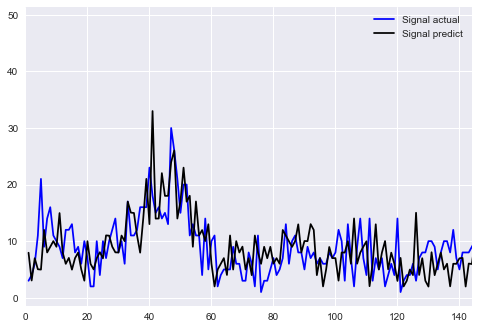

0.429685749889


In [876]:
#Weekwise predictions
def predict_regions(week_no,full_region,n_frequencies):
    region = full_region[144*7*(week_no-1):144*7*(week_no)]
    predict,final_coeff = fft_regions(region,n_frequencies)
    
    next_pred = 2
    
    month_new_coeff = [0]*(next_pred*len(final_coeff))
    for i in range(0,len(final_coeff)):
        month_new_coeff[i*next_pred] = next_pred*final_coeff[i]

    predict_new =np.fft.ifft(month_new_coeff)
    predict_new = abs(predict_new)
    
    t = [i+1 for i in range(0,len(region))]
    
    
    plt.plot(t,full_region[144*7*(week_no):144*7*(week_no+1)],'b',label = 'Signal actual')
    plt.plot(t,predict_new[144*7*1:144*7*2],'k',label = 'Signal predict')
    plt.xlim(144*0,144*1)
    plt.legend()
    plt.show()
    
    act = full_region[144*7*(week_no):144*7*(week_no)+144]
    pre = predict_new[144*7*1:144*7*1+144]
    mean_abs_err = mean_absolute_error(act,pre)
    print mean_abs_err/(sum(act)/float(len(act)))
    
predict_regions(2,regions_cum[25],500)

In [824]:
#Weekwise predictions
def predict_regions(day,full_region,n_frequencies):
    region = full_region[144*(day-1):144*(7+day-1)]
    predict,final_coeff = fft_regions(region,n_frequencies)
    
    next_pred = 2
    
    month_new_coeff = [0]*(next_pred*len(predict))
    for i in range(0,len(final_coeff)):
        month_new_coeff[i*next_pred] = next_pred*final_coeff[i]

    predict_new =np.fft.ifft(month_new_coeff)
    predict_new = abs(predict_new)
    
    t = [i+1 for i in range(0,len(region))]
    next_per_predict = (predict_new[144*7:])[:144]
    
    #plt.plot(full_region[144*(7+day):144*(7+day+1)],'b',label = 'Signal actual')
    #plt.plot(next_per_predict,'k',label = 'Signal predict')
    #plt.xlim(144*0,144*1)
    #plt.legend()
    #plt.show()
    
    #act = full_region[144*7*(week_no):144*7*(week_no)+144]
    #pre = predict_new[144*7*1:144*7*1+144]
    #mean_abs_err = mean_absolute_error(act,pre)
    #print mean_abs_err/(sum(act)/float(len(act)))
    return next_per_predict

fourier_pred = []
temp_pred = []
for i in range(0,40):
    for j in range(1,83):
        temp_pred.extend(predict_regions(j,regions_cum[i],numb_of_freq[i]))
    fourier_pred.extend(temp_pred)
    temp_pred = []

### Train-Test Split

In [825]:
y_pred = []
day = 82
    
for i in range(1,(1+day)):
    y_pred.extend(predict_regions(i,regions_cum[25],500))

#y_pred_new = sum(y_pred,[])
#print mean_absolute_error((output[25])[144*8-5:],[round(j) for j in y_pred])
y_true = (regions_cum[25])[144*7:144*(day+7)]
y_pred = [round(j) for j in y_pred]

In [841]:
tsne_train_flat_lat = [(i[:9068])[(144*7)-5:] for i in tsne_lat]
tsne_train_flat_lon = [(i[:9068])[(144*7)-5:] for i in tsne_lon]
tsne_train_flat_weekday = [(i[:9068])[(144*7)-5:] for i in tsne_weekday]
tsne_train_flat_output = [(i[:9068])[(144*7)-5:] for i in output]
tsne_train_flat_exp_avg = [(i[:9068])[(144*7)-5:] for i in predict_list]

In [842]:
tsne_test_flat_lat = [(i[9068:])[:-144] for i in tsne_lat]
tsne_test_flat_lon = [(i[9068:])[:-144] for i in tsne_lon]
tsne_test_flat_weekday = [(i[9068:])[:-144] for i in tsne_weekday]
tsne_test_flat_output = [(i[9068:])[:-144] for i in output]
tsne_test_flat_exp_avg = [(i[9068:])[:-144] for i in predict_list]

In [845]:
tsne_train_lat = sum(tsne_train_flat_lat, [])
tsne_train_lon = sum(tsne_train_flat_lon, [])
tsne_train_weekday = sum(tsne_train_flat_weekday, [])
tsne_train_output = sum(tsne_train_flat_output, [])
tsne_train_exp_avg = sum(tsne_train_flat_exp_avg,[])

In [846]:
tsne_test_lat = sum(tsne_test_flat_lat, [])
tsne_test_lon = sum(tsne_test_flat_lon, [])
tsne_test_weekday = sum(tsne_test_flat_weekday, [])
tsne_test_output = sum(tsne_test_flat_output, [])
tsne_test_exp_avg = sum(tsne_test_flat_exp_avg,[])

In [852]:
tsne_feature_fft = [0]*number_of_time_stamps
for i in range(0,40):
    tsne_feature_fft = np.vstack((tsne_feature_fft, [regions_cum[i][r:r+number_of_time_stamps] for r in range(144*7,len(regions_cum[i])-number_of_time_stamps)]))
tsne_feature_fft = tsne_feature_fft[1:]

In [860]:
temp = np.array([0,0,0,0,0])*9068
train_features =  [(tsne_feature[i*12955:(12955*i+9068)])[(144*7)-5:] for i in range(0,40)]
temp = [0]*(12955 - 9068)
test_features = [(tsne_feature[(12955*(i))+9068:12955*(i+1)])[:-144] for i in range(0,40)]

In [861]:
train_new_features_fft = []
for i in range(0,40):
    train_new_features_fft.extend(train_features[i])
test_new_features_fft = []
for i in range(0,40):
    test_new_features_fft.extend(test_features[i])

In [864]:
# columns = ['Latitude','Longitude','Weekday','f1','f2']
columns = ['f1','f2','f3','f4','f5']
df_train = pd.DataFrame(data=train_new_features_fft, columns=columns) 
df_train['lat'] = tsne_train_lat
df_train['lon'] = tsne_train_lon
df_train['weekday'] = tsne_train_weekday
df_train['exp_avg'] = tsne_train_exp_avg
df_train['fourier'] = fourier_pred[:322600]

In [866]:
# columns = ['Latitude','Longitude','Weekday','f1','f2']
df_test = pd.DataFrame(data=test_new_features_fft, columns=columns) 
df_test['lat'] = tsne_test_lat
df_test['lon'] = tsne_test_lon
df_test['weekday'] = tsne_test_weekday
df_test['exp_avg'] = tsne_test_exp_avg
df_test['fourier'] = fourier_pred[322600:]

In [867]:
regr1 = RandomForestRegressor(max_features='sqrt',min_samples_leaf=4,min_samples_split=3,n_estimators=40, n_jobs=-1)
regr1.fit(df_train, tsne_train_output)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=4,
           min_samples_split=3, min_weight_fraction_leaf=0.0,
           n_estimators=40, n_jobs=-1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)

In [868]:
y_pred = regr1.predict(df_test)
rndf_test_predictions = [round(value) for value in y_pred]
y_pred = regr1.predict(df_train)
rndf_train_predictions = [round(value) for value in y_pred]

In [869]:
#feature importances
print df_train.columns
print regr1.feature_importances_

Index([u'f1', u'f2', u'f3', u'f4', u'f5', u'lat', u'lon', u'weekday',
       u'exp_avg', u'fourier'],
      dtype='object')
[ 0.09191178  0.10634783  0.10278691  0.21814539  0.16113637  0.00189096
  0.0057767   0.00126687  0.30772426  0.00301292]


### Using XgBoost Regressor

In [870]:
x_model = xgb.XGBRegressor(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=3,
 min_child_weight=3,
 gamma=0,
 subsample=0.8,
 reg_alpha=200, reg_lambda=200,
 colsample_bytree=0.8,nthread=4)
x_model.fit(df_train, tsne_train_output)

XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.8,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=3, missing=None, n_estimators=1000, nthread=4,
       objective='reg:linear', reg_alpha=200, reg_lambda=200,
       scale_pos_weight=1, seed=0, silent=True, subsample=0.8)

In [871]:
y_pred = x_model.predict(df_test)
xgb_test_predictions = [round(value) for value in y_pred]
y_pred = x_model.predict(df_train)
xgb_train_predictions = [round(value) for value in y_pred]

In [872]:
#feature importances
x_model.booster().get_score(importance_type='weight')

{'exp_avg': 797,
 'f1': 941,
 'f2': 640,
 'f3': 762,
 'f4': 894,
 'f5': 897,
 'fourier': 665,
 'lat': 503,
 'lon': 635,
 'weekday': 184}

### Calculating the error metric values for various models

In [873]:
train_mape=[]
test_mape=[]

train_mape.append((mean_absolute_error(tsne_train_output,df_train['f5'].values))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,df_train['exp_avg'].values))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,rndf_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output, xgb_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))

test_mape.append((mean_absolute_error(tsne_test_output, df_test['f5'].values))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, df_test['exp_avg'].values))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, rndf_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, xgb_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))


### Error Metric Matrix

In [874]:
print "Error Metric Matrix (Tree Based Regression Methods) -  MAPE"
print "--------------------------------------------------------------------------------------------------------"
print "Baseline Model -                             Train: ",train_mape[0],"      Test: ",test_mape[0]
print "Exponential Averages Forecasting -           Train: ",train_mape[1],"      Test: ",test_mape[1]
print "Random Forest Regression -                   Train: ",train_mape[2],"     Test: ",test_mape[2]
print "XgBoost Regression -                         Train: ",train_mape[3],"      Test: ",test_mape[3]
print "--------------------------------------------------------------------------------------------------------"

Error Metric Matrix (Tree Based Regression Methods) -  MAPE
--------------------------------------------------------------------------------------------------------
Baseline Model -                             Train:  0.137043151109       Test:  0.136340535736
Exponential Averages Forecasting -           Train:  0.130452122556       Test:  0.129240777816
Random Forest Regression -                   Train:  0.0878878857574      Test:  0.127168270427
XgBoost Regression -                         Train:  0.12672746547       Test:  0.127041746682
--------------------------------------------------------------------------------------------------------
